In [1]:
from emrecharge.datasets import EMDataset
from discretize.utils import volume_average
import numpy as np
import geopandas as gpd
import dill
import matplotlib.pyplot as plt
from discretize import TensorMesh
from scipy.spatial import cKDTree as kdtree
from SimPEG.utils import rotate_points_from_normals
from verde import distance_mask
import pandas as pd
import numpy.ma as ma
from matplotlib.colors import LogNorm
from emrecharge.colocation import find_locations_in_distance

In [2]:
gdf_cv = gpd.read_file("../data/shp/cv.shp")
gdf_cv_3310 = gdf_cv.to_crs(3310)

In [3]:
df_bedrock = pd.read_csv("./bedrock_surface.csv")
xy_bedrock = df_bedrock[['UTMX', 'UTMY']].values


In [4]:
geoms = gpd.points_from_xy(xy_bedrock[:,0], xy_bedrock[:,1])
gdf_pts_bedrock = gpd.GeoDataFrame(data={}, geometry=geoms)
gdf_pts_bedrock = gdf_pts_bedrock.set_crs(epsg=3310)

In [5]:
gdf_pts_bedrock.to_file("./points/bedrock_cv_pts.shp")

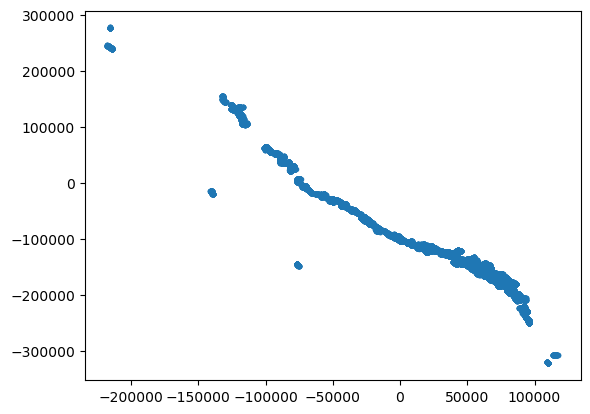

In [6]:
plt.plot(xy_bedrock[:,0], xy_bedrock[:,1], '.')

In [7]:
df_bedrock.head(3)

,BEDROCK_SURFACE_DEPTH,BEDROCK_SURFACE_ELEVATION,UTMX,UTMY
0,2.000,325.600,-215461.437500,276938.28125
1,2.000,325.800,-215482.203125,276968.56250
2,60.391,153.709,-213852.750000,239359.46875


In [8]:
SPATIAL_UNIT = 'm'
em_data = EMDataset(
    "./em_resistivity.csv", 
    "./thickness.csv",
    SPATIAL_UNIT
)

In [9]:
em_data.hz[1:] / em_data.hz[:-1]

array([1.138     , 1.13796134, 1.13783784, 1.13776722, 1.1380853 ,
       1.13784067, 1.13795486, 1.13782635, 1.1378513 , 1.13787713,
       1.13793103, 1.13787275, 1.13740053, 1.1380597 , 1.13852459,
       1.137509  , 1.13797468, 1.13793103, 1.13782991, 1.1378866 ,
       1.13816535, 1.13764511, 1.13819242, 1.13780738, 1.13777578,
       1.13810843, 1.13786509, 1.13781513, 1.        ])

In [10]:
def rotate_vector(xy, invert=False):
    x0_max = 128989.96617666919
    y0_min = -344621.31282856315    
    if invert:
        xy_norm = np.c_[xy[:,0], xy[:,1], np.zeros_like(xy[:,0])]
        xy_norm_rot = rotate_points_from_normals(xy_norm, np.array([0,1,0]), np.array([-352306.81278939766, 643151.2476351159,0]))
        xy_norm_rot[:,0] += x0_max
        xy_norm_rot[:,1] += y0_min
    else:
        xy_norm = np.c_[xy[:,0]-x0_max, xy[:,1]-y0_min, np.zeros_like(xy[:,0])]
        xy_norm_rot = rotate_points_from_normals(xy_norm, np.array([-352306.81278939766, 643151.2476351159,0]), np.array([0,1,0]))
    return xy_norm_rot[:,:2]

In [11]:
hz_aem = em_data.hz
hz_uniform = np.ones(60)*2.

In [12]:
mesh_1d_aem = TensorMesh([hz_aem])
mesh_1d_uniform = TensorMesh([hz_uniform])

In [13]:
P_1d = mesh_1d_aem.get_interpolation_matrix(mesh_1d_uniform.cell_centers)

In [14]:
inds_aem_active = np.load("inds_active_aem.npy")

In [15]:
RHO = em_data.resistivity
xy_aem = em_data.xy

In [16]:
RHO_ACTIVE = RHO[inds_aem_active,:]
xy_aem_active = xy_aem[inds_aem_active,:]

In [17]:
xy_aem_rot = rotate_vector(xy_aem)
xy_aem_active_rot = rotate_vector(xy_aem_active)
xy_bedrock_rot = rotate_vector(xy_bedrock)

In [18]:
results_rock_physics_grid = dill.load(open("rock_physics_grid.pik", "rb"))

In [19]:
mesh = results_rock_physics_grid['mesh']
mesh_coarse = results_rock_physics_grid['mesh_coarse']
rho_fine_cv_grid_idw = results_rock_physics_grid['rho_fine_cv_grid_idw']
rho_coarse_cv_grid_idw = results_rock_physics_grid['rho_coarse_cv_grid_idw']
wt_idw = results_rock_physics_grid['wt_idw']
xy_grid_coarse_rot = results_rock_physics_grid['xy_grid_coarse_rot']

In [20]:
from scipy.interpolate import NearestNDInterpolator
f_rho_fine = NearestNDInterpolator(mesh_coarse.cell_centers, rho_fine_cv_grid_idw)
f_rho_coarse = NearestNDInterpolator(mesh_coarse.cell_centers, rho_coarse_cv_grid_idw)

In [21]:
rho_fine_cv_mesh = f_rho_fine(mesh.cell_centers)
rho_coarse_cv_mesh = f_rho_coarse(mesh.cell_centers)

In [22]:
rho_fine_cv_mesh

array([12.83776225, 12.83776225, 12.83776225, ..., 15.66579367,
       15.66579367, 15.66579367])

In [23]:
rho_fine_cv_aem = f_rho_fine(xy_aem_rot)
rho_coarse_cv_aem = f_rho_coarse(xy_aem_rot)

In [24]:
# fig, ax = plt.subplots(1,1)
# mesh_coarse.plot_image(rho_fine_cv_grid_idw, ax=ax)
# ax.set_aspect(1)

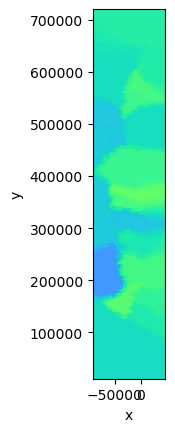

In [25]:
fig, ax = plt.subplots(1,1)
mesh.plot_image(rho_fine_cv_mesh, ax=ax, pcolor_opts={'norm':LogNorm(vmin=3, vmax=300), 'cmap':'turbo'})
ax.scatter(xy_aem_rot[:,0], xy_aem_rot[:,1], s=1, c=rho_fine_cv_aem, cmap='turbo', norm=LogNorm(vmin=3, vmax=300))
ax.set_aspect(1)

In [26]:
mesh.h[0].sum() / 1e3

139.6

In [27]:
mesh.h[1].sum() / 1e3

709.2

In [28]:
xy_grid = mesh.cell_centersxy_grid = mesh.cell_centers
tree = kdtree(xy_aem_rot)
k_nearest_points = 100
d, inds_idw = tree.query(xy_grid, k=int(k_nearest_points))
dx, dy = 400, 400
epsilon = np.min([dx, dy])
power = 1.
w = 1.0 / ((d + epsilon) ** power)
mask_inds = ~distance_mask(
    (xy_aem_rot[:, 0], xy_aem_rot[:, 1]),
    maxdist=3000,
    coordinates=(xy_grid[:,0], xy_grid[:,1]),
)

In [29]:
tree = kdtree(xy_aem_active_rot)
k_nearest_points = 100
d_active, inds_idw_active = tree.query(xy_grid, k=int(k_nearest_points))
dx, dy = 400, 400
epsilon = np.min([dx, dy])
power = 1.
w_active = 1.0 / ((d_active + epsilon) ** power)
mask_inds__active = ~distance_mask(
    (xy_aem_active_rot[:, 0], xy_aem_active_rot[:, 1]),
    maxdist=3000,
    coordinates=(xy_grid[:,0], xy_grid[:,1]),
)

In [30]:
f_gse_wse = NearestNDInterpolator(xy_grid, wt_idw.data)
gse_wse_aem = f_gse_wse(xy_aem_rot)

In [31]:
depth_aem_center = mesh_1d_aem.cell_centers

In [32]:
spatial_conversion = 1.
max_distance = 2000.
wt_int = wt_idw.data
pts, inds = find_locations_in_distance(xy_bedrock_rot, xy_aem_rot)
f_bedrock = NearestNDInterpolator(xy_bedrock_rot, df_bedrock['BEDROCK_SURFACE_DEPTH'].values * spatial_conversion)
depth_bedrock = np.zeros(em_data.num_soundings, dtype=float) * np.nan
depth_bedrock[inds] = f_bedrock(xy_aem_rot[inds])
DEPTH = np.tile(em_data.depth[:-1], (em_data.num_soundings, 1))
DEPTH_BEDROCK = np.tile(depth_bedrock, (em_data.num_layers, 1)).T
_, inds_int = find_locations_in_distance(xy_bedrock_rot, xy_grid, distance=max_distance)
depth_bedrock_int_tmp = f_bedrock(xy_grid[inds_int,:])
wt_int_tmp = wt_int[inds_int]
base_bedrock_int_tmp = wt_int_tmp.copy()
inds_tmp = depth_bedrock_int_tmp<wt_int_tmp
base_bedrock_int_tmp[inds_tmp] = depth_bedrock_int_tmp[inds_tmp]
base_int = wt_int.copy()
base_int[inds_int] = base_bedrock_int_tmp

In [33]:
base_int = np.clip(base_int, 3, 110)
base_int = ma.masked_array(base_int, mask=wt_idw.mask)

In [34]:
f_base = NearestNDInterpolator(xy_grid, base_int.data)
base_aem = f_base(xy_aem_rot)
base_aem = np.clip(base_aem, 3, 110)

In [35]:
np.save('base_depth_aem', np.c_[xy_aem_rot, base_aem])

(array([90214., 87040., 41052., 35654., 25286., 28576., 27196., 24636.,
         8489.,  8618.]),
 array([  3.56639273,  14.83855125,  26.11070978,  37.3828683 ,
         48.65502683,  59.92718535,  71.19934388,  82.4715024 ,
         93.74366093, 105.01581945, 116.28797798]),
 <BarContainer object of 10 artists>)

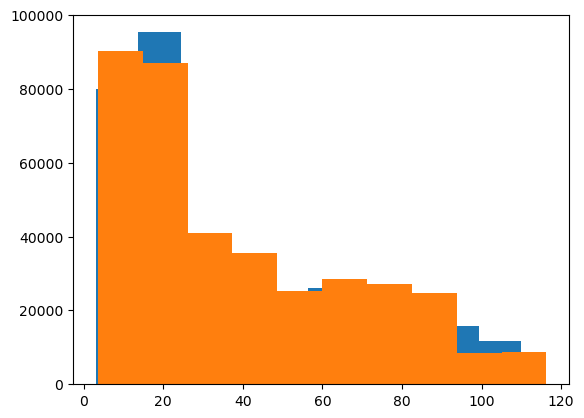

In [36]:
plt.hist(base_aem)
plt.hist(gse_wse_aem)

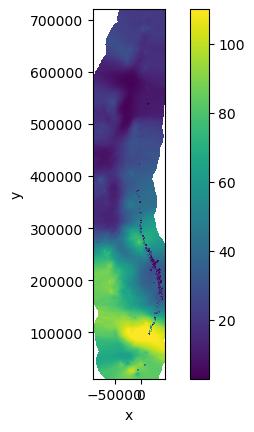

In [37]:
fig, ax = plt.subplots(1,1)
out = mesh.plot_image(base_int, ax=ax)
plt.colorbar(out[0])
ax.set_aspect(1)

In [38]:
base_int.data.max()

110.0

In [39]:
Z = np.tile(depth_aem_center, (em_data.num_soundings, 1))
Z_base = np.tile(base_aem, (30, 1)).T
HZ = np.tile(hz_aem, (em_data.num_soundings, 1))
HZ[Z>Z_base] = 0.

In [40]:
RHO_ABOVE = RHO.copy()
SIGMA_ABOVE = 1./RHO_ABOVE
SIGMA_ABOVE[Z>Z_base] = 0.
RHO_ABOVE[Z>Z_base] = 0.
rho_avg = 1./((SIGMA_ABOVE * HZ).sum(axis=1) / HZ.sum(axis=1))
values = rho_avg.copy()
values_idw = np.sum(w * values[inds_idw], axis=1) / np.sum(w, axis=1)
values_idw = ma.masked_array(values_idw, mask=mask_inds)
rho_avg_idw = values_idw.copy()

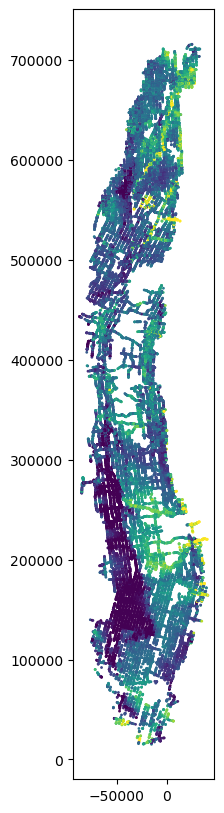

In [41]:
fig = plt.figure(figsize=(10, 10))
plt.scatter(xy_aem_rot[::10,0], xy_aem_rot[::10,1], s=1, c=rho_avg[::10], norm=LogNorm(vmin=5, vmax=150)) 
plt.gca().set_aspect(1)
plt.show()


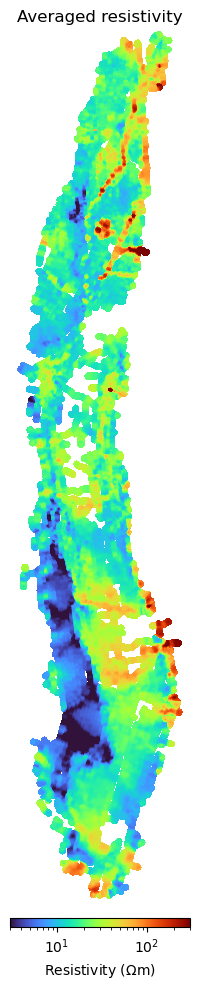

In [42]:
fig, ax = plt.subplots(1,1, figsize=(3, 10))
out = mesh.plot_image(rho_avg_idw, ax=ax, pcolor_opts={'norm':LogNorm(vmin=3, vmax=300), 'cmap':'turbo'})
ax.axis('off')

ax.set_aspect(1)
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.01, pad=0.02)
cb.set_label("Resistivity ($\Omega$m)")
ax.set_title("Averaged resistivity")
plt.tight_layout()
fig.savefig('avg_rho.png', dpi=300)

## Create an interpolated 3D resistivity model

In [43]:
RHO_ABOVE_nan = RHO_ABOVE.copy()
RHO_ABOVE_nan[RHO_ABOVE==0.] = np.nan

In [44]:
RHO_INT = np.zeros((mesh.n_cells, len(hz_aem)))
for i_layer in range(len(hz_aem)):
    values = RHO[:,i_layer].copy()
    values_idw = np.sum(w * values[inds_idw], axis=1) / np.sum(w, axis=1)
    # values_idw = ma.masked_array(values_idw, mask=mask_inds)
    RHO_INT[:,i_layer] = values_idw

In [45]:
RHO_INT_uniform = 1./((1./RHO_INT) * P_1d.T)
Z3D = np.tile(mesh_1d_uniform.cell_centers, (mesh.n_cells, 1))
BASE3D = np.tile(base_int.data, (60, 1)).T
INDS3D = Z3D>BASE3D
# RHO_INT_uniform[INDS3D] = np.nan
# RHO_INT_uniform[mask_inds,:] = np.nan

In [46]:
base_inds_3d = INDS3D[:,::-1].copy()
base_inds_3d[mask_inds,:] = True
base_inds_3d = base_inds_3d.flatten(order='F')
rho_int_uniform_simpeg = RHO_INT_uniform[:,::-1].flatten(order='F')
rho_int_uniform_simpeg = ma.masked_array(rho_int_uniform_simpeg, mask=base_inds_3d)

In [47]:
base_inds_3d_active = INDS3D[:,::-1].copy()
base_inds_3d_active[mask_inds__active,:] = True
base_inds_3d_active = base_inds_3d.flatten(order='F')


In [48]:
mesh_3d = TensorMesh([mesh.h[0], mesh.h[1], hz_uniform], x0=[mesh.x0[0], mesh.x0[1], -np.sum(hz_uniform)])

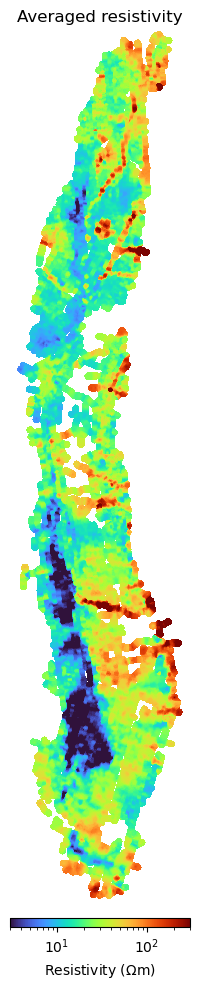

In [49]:
fig, ax = plt.subplots(1,1, figsize=(3, 10))
out = mesh_3d.plot_slice(rho_int_uniform_simpeg, ax=ax, ind=-2, pcolor_opts={'norm':LogNorm(vmin=3, vmax=300), 'cmap':'turbo'})
ax.axis('off')
ax.set_aspect(1)
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.01, pad=0.02)
cb.set_label("Resistivity ($\Omega$m)")
ax.set_title("Averaged resistivity")
plt.tight_layout()


## Transform resistivity to CF

In [50]:
def from_sigma_to_fraction(sigma, sigma_fine, sigma_coarse):
    sigma_bounded = sigma.copy()
    sigma_bounded[sigma >= sigma_fine] = sigma_fine
    sigma_bounded[sigma <= sigma_coarse] = sigma_coarse
    fraction_coarse = (sigma_fine - sigma_bounded) / (sigma_fine - sigma_coarse)
    return fraction_coarse

In [51]:
# RHO_ABOVE = RHO.copy()
# SIGMA_ABOVE = 1./RHO_ABOVE
# SIGMA_ABOVE[Z>Z_base] = 0.
# RHO_ABOVE[Z>Z_base] = 0.


In [52]:
SIGMA = 1./RHO.copy()

In [53]:
FCD = np.zeros_like(RHO_ABOVE)

In [54]:
for ii in range(em_data.num_soundings):
    FCD[ii,:] = from_sigma_to_fraction(SIGMA[ii,:], 1./rho_fine_cv_aem[ii], 1./rho_coarse_cv_aem[ii])

In [55]:
fc_avg = (FCD[inds_aem_active,:] * HZ[inds_aem_active,:]).sum(axis=1) / HZ[inds_aem_active,:].sum(axis=1)
values = fc_avg.copy()
values_idw = np.sum(w_active * values[inds_idw_active], axis=1) / np.sum(w_active, axis=1)
values_idw = ma.masked_array(values_idw, mask=mask_inds__active)
fc_idw = values_idw.copy()

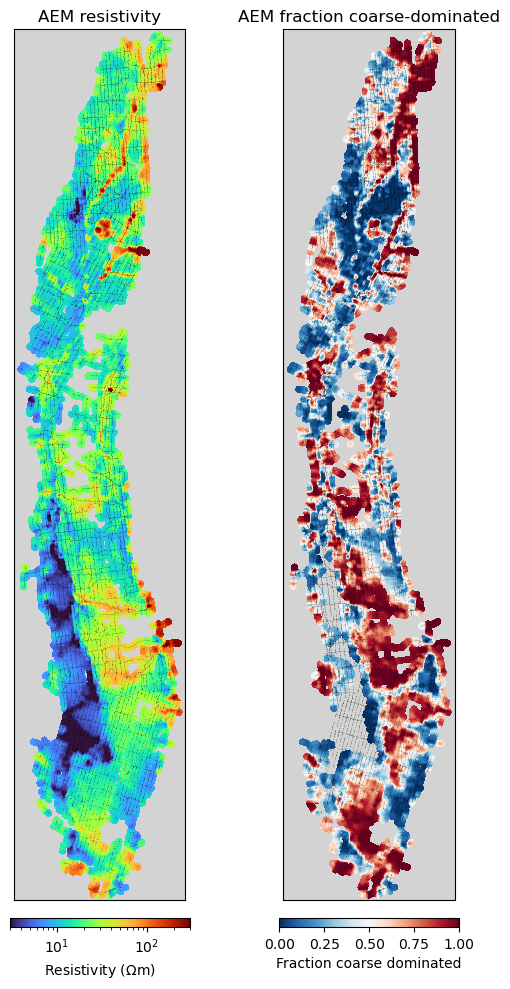

In [56]:
fig, axs = plt.subplots(1,2, figsize=(6, 10))
ax1, ax2 = axs
out = mesh.plot_image(rho_avg_idw, ax=ax1, pcolor_opts={'norm':LogNorm(vmin=3, vmax=300), 'cmap':'turbo'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.01, pad=0.02, ax=ax1)
cb.set_label("Resistivity ($\Omega$m)")
ax1.set_title("AEM resistivity")

out = mesh.plot_image(fc_idw, ax=ax2, pcolor_opts={'cmap':'RdBu_r'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.01, pad=0.02, ax=ax2)
cb.set_label("Fraction coarse dominated")
ax2.set_title("AEM fraction coarse-dominated")


for ax in axs:
    ax.plot(xy_aem_rot[::10,0], xy_aem_rot[::10,1], 'k,', alpha=0.1)
    ax.set_xticks([])
    ax.set_yticks([])  
    ax.set_xlabel("")
    ax.set_ylabel("")    
    # ax.axis('off')
    ax.set_aspect(1)
    ax.set_facecolor('lightgrey')
# ax.set_title("Averaged resistivity")
plt.tight_layout()
fig.savefig('avg_rho_.png', dpi=300)

In [57]:
FCD_INT = np.zeros((mesh.n_cells, len(hz_aem)))
for i_layer in range(len(hz_aem)):
    values = FCD[inds_aem_active,i_layer].copy()
    values_idw = np.sum(w_active * values[inds_idw_active], axis=1) / np.sum(w, axis=1)
    # values_idw = ma.masked_array(values_idw, mask=mask_inds)
    FCD_INT[:,i_layer] = values_idw

In [58]:
FCD_INT_uniform = FCD_INT * P_1d.T

In [59]:
fcd_int_uniform_simpeg = FCD_INT_uniform[:,::-1].flatten(order='F')
fcd_int_uniform_simpeg = ma.masked_array(fcd_int_uniform_simpeg, mask=base_inds_3d_active)

In [60]:
fcd_int_uniform_simpeg.mask

array([ True,  True,  True, ...,  True,  True,  True])

In [61]:
mesh_3d.write_vtk('3d_models.vtr', models={'rho':rho_int_uniform_simpeg.data, 'mask': rho_int_uniform_simpeg.mask.astype(int), 'fcd':fcd_int_uniform_simpeg.data, 'mask_active': fcd_int_uniform_simpeg.mask.astype(int)})

## TODO: 

- calculate averaged CF at the AEM grid [done]
- then calculate recharge metrics [done]
- update rho_cd and rho_fd with other percentiel values [do we need?]

## TODO: 
- Calculate pathlength
- ...

In [62]:
mesh_3d.n_cells

37126620

In [63]:
from emrecharge.metrics import (
    classify_cf, 
    get_ready_for_fmm, 
    run_fmm,
    get_distance_to_first_lowK
)

In [64]:
xyz_base = np.c_[xy_grid, base_int.data]
mesh_fmm, inds_source = get_ready_for_fmm(mesh_3d, xyz_base)

In [65]:
threshold = 0.1
binary_model_10 = classify_cf(fcd_int_uniform_simpeg.data, threshold)
threshold = 0.2
binary_model_20 = classify_cf(fcd_int_uniform_simpeg.data, threshold)
threshold = 0.5
binary_model_30 = classify_cf(fcd_int_uniform_simpeg.data, threshold)
threshold = 0.8
binary_model_40 = classify_cf(fcd_int_uniform_simpeg.data, threshold)
threshold = 0.9
binary_model_50 = classify_cf(fcd_int_uniform_simpeg.data, threshold)

In [66]:
path_length_10 = run_fmm(binary_model_10, mesh_fmm, inds_source, vel_ratio=None)
path_length_20 = run_fmm(binary_model_20, mesh_fmm, inds_source, vel_ratio=None)
path_length_30 = run_fmm(binary_model_30, mesh_fmm, inds_source, vel_ratio=None)
path_length_40 = run_fmm(binary_model_40, mesh_fmm, inds_source, vel_ratio=None)
path_length_50 = run_fmm(binary_model_50, mesh_fmm, inds_source, vel_ratio=None)

In [67]:
# path_length = ma.masked_array(path_length, mask=mask_inds__active)

In [68]:
path_length_10_norm = path_length_10.data / base_int.data
path_length_10_norm = ma.masked_array(path_length_10_norm, mask=mask_inds__active)
path_length_20_norm = path_length_20.data / base_int.data
path_length_20_norm = ma.masked_array(path_length_20_norm, mask=mask_inds__active)
path_length_30_norm = path_length_30.data / base_int.data
path_length_30_norm = ma.masked_array(path_length_30_norm, mask=mask_inds__active)
path_length_40_norm = path_length_40.data / base_int.data
path_length_40_norm = ma.masked_array(path_length_40_norm, mask=mask_inds__active)
path_length_50_norm = path_length_50.data / base_int.data
path_length_50_norm = ma.masked_array(path_length_50_norm, mask=mask_inds__active)

In [69]:
nx, ny, nz = mesh_3d.vnC
z = mesh_3d.vectorNz[1:]
path_to_no_flow_50 = get_distance_to_first_lowK(binary_model_50.reshape((nx*ny, nz), order='F'), base_inds_3d_active.reshape((nx*ny, nz), order='F'), z)
path_to_no_flow_50 = ma.masked_array(path_to_no_flow_50, mask=mask_inds__active)
path_to_no_flow_40 = get_distance_to_first_lowK(binary_model_40.reshape((nx*ny, nz), order='F'), base_inds_3d_active.reshape((nx*ny, nz), order='F'), z)
path_to_no_flow_40 = ma.masked_array(path_to_no_flow_40, mask=mask_inds__active)
path_to_no_flow_30 = get_distance_to_first_lowK(binary_model_30.reshape((nx*ny, nz), order='F'), base_inds_3d_active.reshape((nx*ny, nz), order='F'), z)
path_to_no_flow_30 = ma.masked_array(path_to_no_flow_30, mask=mask_inds__active)
path_to_no_flow_20 = get_distance_to_first_lowK(binary_model_20.reshape((nx*ny, nz), order='F'), base_inds_3d_active.reshape((nx*ny, nz), order='F'), z)
path_to_no_flow_20 = ma.masked_array(path_to_no_flow_20, mask=mask_inds__active)
path_to_no_flow_10 = get_distance_to_first_lowK(binary_model_10.reshape((nx*ny, nz), order='F'), base_inds_3d_active.reshape((nx*ny, nz), order='F'), z)
path_to_no_flow_10 = ma.masked_array(path_to_no_flow_10, mask=mask_inds__active)

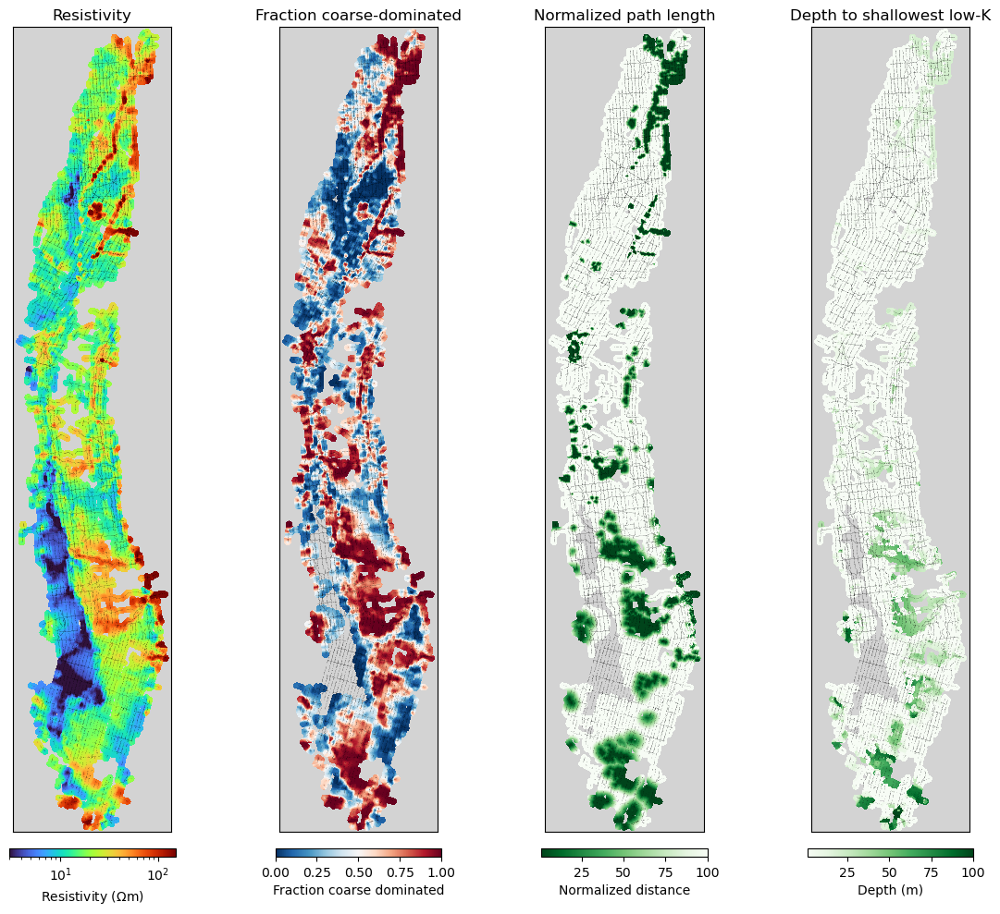

In [70]:
fig, axs = plt.subplots(1,4, figsize=(12, 10))
ax1, ax2, ax3, ax4 = axs
out = mesh.plot_image(rho_avg_idw, ax=ax1, pcolor_opts={'norm':LogNorm(vmin=3, vmax=150), 'cmap':'turbo'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.01, pad=0.02, ax=ax1)
cb.set_label("Resistivity ($\Omega$m)")
ax1.set_title("Resistivity")

out = mesh.plot_image(fc_idw, ax=ax2, pcolor_opts={'cmap':'RdBu_r'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.01, pad=0.02, ax=ax2)
cb.set_label("Fraction coarse dominated")
ax2.set_title("Fraction coarse-dominated")

out = mesh.plot_image(path_length_50_norm, ax=ax3, clim=(1, 100), pcolor_opts={'cmap':'Greens_r'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.01, pad=0.02, ax=ax3)
cb.set_label("Normalized distance")
ax3.set_title("Normalized path length")

out = mesh.plot_image(path_to_no_flow_50, ax=ax4, clim=(1, 100),pcolor_opts={'cmap':'Greens'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.01, pad=0.02, ax=ax4)
cb.set_label("Depth (m)")
ax4.set_title("Depth to shallowest low-K")


for ax in axs:
    ax.plot(xy_aem_rot[::10,0], xy_aem_rot[::10,1], 'k,', alpha=0.1)
    ax.set_xticks([])
    ax.set_yticks([])  
    ax.set_xlabel("")
    ax.set_ylabel("")    
    # ax.axis('off')
    ax.set_aspect(1)
    ax.set_facecolor('lightgrey')
# ax.set_title("Averaged resistivity")
plt.tight_layout()
fig.savefig('2d_metric_maps.png', dpi=300)

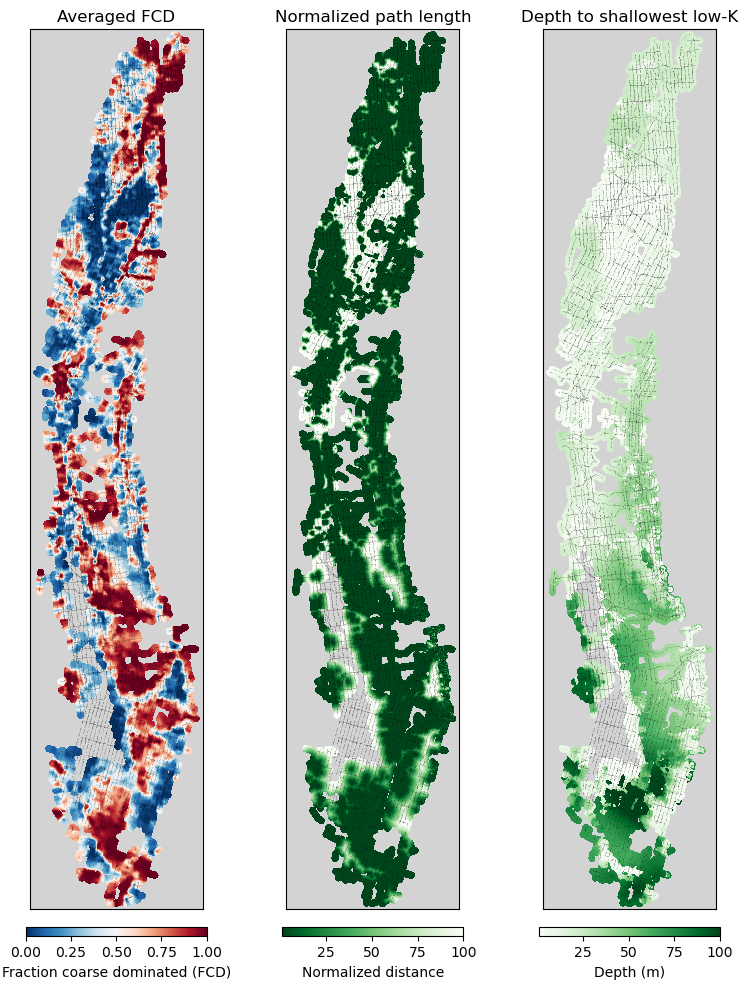

In [71]:
fig, axs = plt.subplots(1,3, figsize=(8, 10))
ax2, ax3, ax4 = axs
# out = mesh.plot_image(rho_avg_idw, ax=ax1, pcolor_opts={'norm':LogNorm(vmin=3, vmax=150), 'cmap':'turbo'})
# cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.01, pad=0.02, ax=ax1)
# cb.set_label("Resistivity ($\Omega$m)")
# ax1.set_title("Resistivity")

out = mesh.plot_image(fc_idw, ax=ax2, pcolor_opts={'cmap':'RdBu_r'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.01, pad=0.02, ax=ax2)
cb.set_label("Fraction coarse dominated (FCD)")
ax2.set_title("Averaged FCD")

out = mesh.plot_image(path_length_10_norm, ax=ax3, clim=(1, 100), pcolor_opts={'cmap':'Greens_r'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.01, pad=0.02, ax=ax3)
cb.set_label("Normalized distance")
ax3.set_title("Normalized path length")

out = mesh.plot_image(path_to_no_flow_10, ax=ax4, clim=(1, 100),pcolor_opts={'cmap':'Greens'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.01, pad=0.02, ax=ax4)
cb.set_label("Depth (m)")
ax4.set_title("Depth to shallowest low-K")


for ax in axs:
    ax.plot(xy_aem_rot[::10,0], xy_aem_rot[::10,1], 'k,', alpha=0.1)
    ax.set_xticks([])
    ax.set_yticks([])  
    ax.set_xlabel("")
    ax.set_ylabel("")    
    # ax.axis('off')
    ax.set_aspect(1)
    ax.set_facecolor('lightgrey')
# ax.set_title("Averaged resistivity")
plt.tight_layout()
fig.savefig('2d_metric_maps.png', dpi=300)

## Transform to the original grid

In [72]:
from discretize import TensorMesh
from discretize.utils import mesh_builder_xyz
mesh_orig = mesh_builder_xyz(xy_aem[:,:2], [400, 400], padding_distance=[[4000, 4000], [4000, 4000]], expansion_factor=1)

In [73]:
mesh_orig.write_UBC('mesh_orig.msh')

In [74]:
xy_grid_orig = mesh_orig.cell_centers

In [75]:
xy_grid_rot = rotate_vector(xy_grid, invert=True)

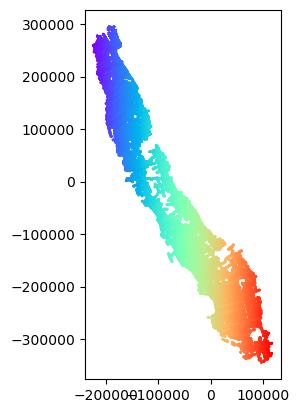

In [76]:
# plt.plot(xy_grid_orig[:,0], xy_grid_orig[:,1], ',', color='orange')
# plt.plot(xy_grid_rot[~mask_inds,0], xy_grid_rot[~mask_inds,1], ',')
plt.scatter(xy_aem[::10,0], xy_aem[::10,1], c=xy_aem[::10,0], cmap='rainbow', s=1)

plt.gca().set_aspect(1)

In [77]:
tree_final = kdtree(xy_grid_rot)
k_nearest_points = 10
d_final, inds_idw_final = tree_final.query(xy_grid_orig, k=int(k_nearest_points))
dx, dy = 400, 400
epsilon = np.min([dx, dy])
power = 1.
w_final = 1.0 / ((d_final + epsilon) ** power)

In [78]:
def idw_interpolation(values, w, inds_idw):
    values_idw = np.sum(w * values[inds_idw], axis=1) / np.sum(w, axis=1)
    return values_idw

In [79]:
mask_inds_final = ~distance_mask(
    (xy_aem[:, 0], xy_aem[:, 1]),
    maxdist=3000,
    coordinates=(xy_grid_orig[:,0], xy_grid_orig[:,1]),
)

In [80]:
mask_inds_final_active = ~distance_mask(
    (xy_aem_active[:, 0], xy_aem_active[:, 1]),
    maxdist=3000,
    coordinates=(xy_grid_orig[:,0], xy_grid_orig[:,1]),
)

In [81]:
rho_avg_final = idw_interpolation(rho_avg_idw.data, w_final, inds_idw_final)
path_length_50_norm_final = idw_interpolation(path_length_50_norm.data, w_final, inds_idw_final)
path_to_no_flow_50_final = idw_interpolation(path_to_no_flow_50.data, w_final, inds_idw_final)
path_length_40_norm_final = idw_interpolation(path_length_40_norm.data, w_final, inds_idw_final)
path_to_no_flow_40_final = idw_interpolation(path_to_no_flow_40.data, w_final, inds_idw_final)
path_length_30_norm_final = idw_interpolation(path_length_30_norm.data, w_final, inds_idw_final)
path_to_no_flow_30_final = idw_interpolation(path_to_no_flow_30.data, w_final, inds_idw_final)
path_length_20_norm_final = idw_interpolation(path_length_20_norm.data, w_final, inds_idw_final)
path_to_no_flow_20_final = idw_interpolation(path_to_no_flow_20.data, w_final, inds_idw_final)
path_length_10_norm_final = idw_interpolation(path_length_10_norm.data, w_final, inds_idw_final)
path_to_no_flow_10_final = idw_interpolation(path_to_no_flow_10.data, w_final, inds_idw_final)
fc_final = idw_interpolation(fc_idw.data, w_final, inds_idw_final)

In [82]:
inds

array([   956,    961,    963, ..., 376758, 376759, 376760])

In [83]:
geoms = gpd.points_from_xy(mesh_orig.cell_centers[:,0], mesh_orig.cell_centers[:,1])
gdf_pts = gpd.GeoDataFrame(data={}, geometry=geoms)
gdf_pts = gdf_pts.set_crs(epsg=3310)
gdf_pts_cv = gdf_pts.clip(gdf_cv_3310)
inds_cv = np.array(list(gdf_pts_cv.index))
mask_inds_cv = np.ones(mesh_orig.n_cells, dtype=bool)
mask_inds_cv[inds_cv] = False 

base_int_final = idw_interpolation(base_int.data, w_final, inds_idw_final)
base_int_final = ma.masked_array(base_int_final, mask=mask_inds_cv)

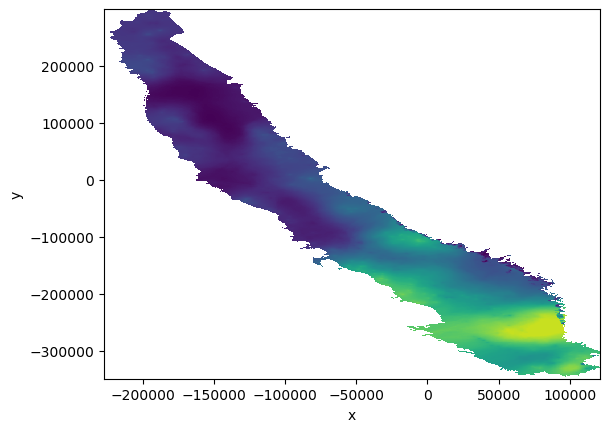

In [84]:
out = mesh_orig.plot_image(base_int_final, clim=(3, 120))
plt.show()

In [85]:
# rho_fine_cv_grid_idw

rho_fine_cv_grid_idw_final = idw_interpolation(rho_fine_cv_mesh, w_final, inds_idw_final)
rho_fine_cv_grid_idw_final = ma.masked_array(rho_fine_cv_grid_idw_final, mask=mask_inds_cv)

In [86]:
rho_coarse_cv_grid_idw_final = idw_interpolation(rho_coarse_cv_mesh, w_final, inds_idw_final)
rho_coarse_cv_grid_idw_final = ma.masked_array(rho_coarse_cv_grid_idw_final, mask=mask_inds_cv)

In [87]:
gdf_subbasin = gpd.read_file("./subbasins_cv_all.geojson")
gdf_subbasin_cv = gdf_subbasin.clip(gdf_cv_3310)
gdf_subbasin_cv.to_file("../data/shp/subbasins_cv.shp")


/var/folders/4m/sc07bkn154s8jfc7xp164by00000gq/T/ipykernel_38899/44459023.py:3: UserWarning: Column names longer than 10 characters will be truncated when saved to ESRI Shapefile.
  gdf_subbasin_cv.to_file("../data/shp/subbasins_cv.shp")


In [88]:
from matplotlib.colors import LogNorm
import rasterio
from rasterio.plot import show
src = rasterio.open("./cv_terrain.tiff")

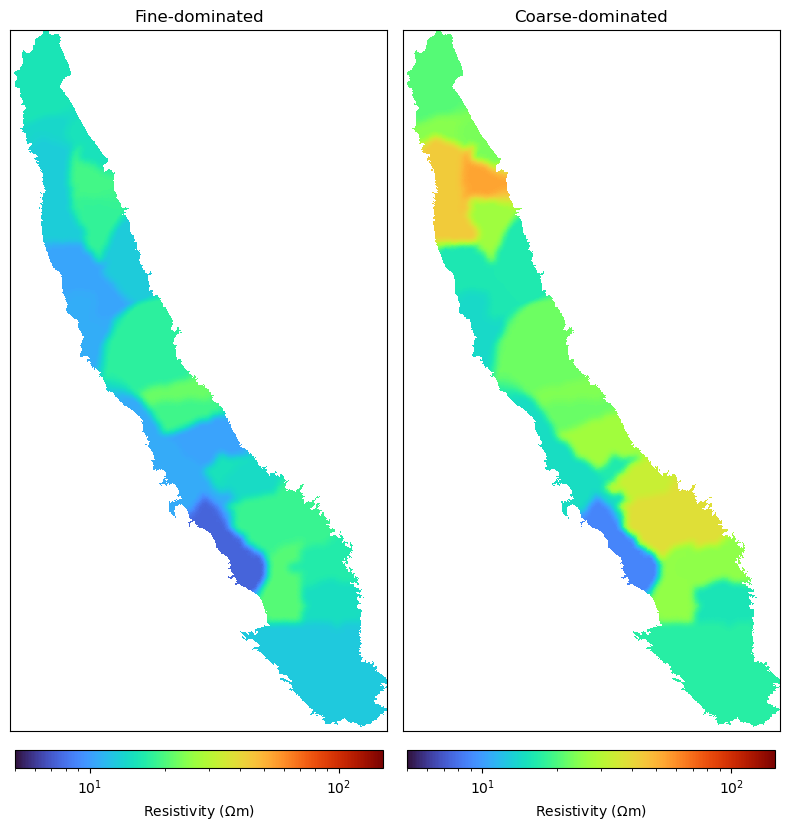

In [89]:
fig, axs = plt.subplots(1,2, figsize=(8, 10))
ax1, ax2 = axs
out = mesh_orig.plot_image(rho_fine_cv_grid_idw_final, ax=ax1, pcolor_opts={'norm':LogNorm(vmin=5, vmax=150), 'cmap':'turbo'})
cb1 = plt.colorbar(out[0], ax=ax1, orientation='horizontal', fraction=0.02, pad=0.02)
out = mesh_orig.plot_image(rho_coarse_cv_grid_idw_final, ax=ax2, pcolor_opts={'norm':LogNorm(vmin=5, vmax=150), 'cmap':'turbo'})
cb2 = plt.colorbar(out[0], ax=ax2, orientation='horizontal', fraction=0.02, pad=0.02)
cb1.set_label("Resistivity ($\Omega$m)")
cb2.set_label("Resistivity ($\Omega$m)")
for ax in axs:
    # ax.plot(xy_norm_rot[:,0], xy_norm_rot[:,1], 'k-', lw=0.5)
    ax.set_xticks([])
    ax.set_yticks([])
    ax.set_xlabel("")
    ax.set_ylabel("")    
    ax.set_aspect(1)
ax1.set_title("Fine-dominated")
ax2.set_title("Coarse-dominated")
plt.tight_layout()
plt.show()

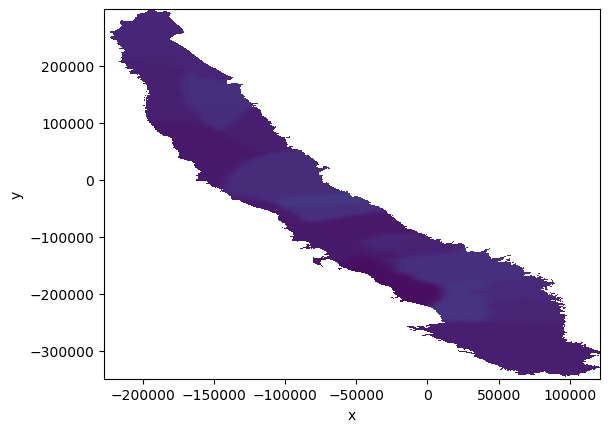

In [90]:
out = mesh_orig.plot_image(rho_fine_cv_grid_idw_final, clim=(3, 120))
plt.show()

In [91]:
mask_cdwr = np.load('fc_avg_cdwr_mask.npy')

In [92]:
fc_avg_cdwr = np.load('fc_avg_cdwr.npy')
fc_avg_cdwr = ma.masked_array(fc_avg_cdwr, mask=np.logical_or(mask_inds_final_active, mask_cdwr))

In [93]:
rho_avg_final = ma.masked_array(rho_avg_final, mask=mask_inds_final)
path_length_50_norm_final = ma.masked_array(path_length_50_norm_final, mask=mask_inds_final_active)
path_to_no_flow_50_final = ma.masked_array(path_to_no_flow_50_final, mask=mask_inds_final_active)
path_length_40_norm_final = ma.masked_array(path_length_40_norm_final, mask=mask_inds_final_active)
path_to_no_flow_40_final = ma.masked_array(path_to_no_flow_40_final, mask=mask_inds_final_active)
path_length_30_norm_final = ma.masked_array(path_length_30_norm_final, mask=mask_inds_final_active)
path_to_no_flow_30_final = ma.masked_array(path_to_no_flow_30_final, mask=mask_inds_final_active)
path_length_20_norm_final = ma.masked_array(path_length_20_norm_final, mask=mask_inds_final_active)
path_to_no_flow_20_final = ma.masked_array(path_to_no_flow_20_final, mask=mask_inds_final_active)
path_length_10_norm_final = ma.masked_array(path_length_10_norm_final, mask=mask_inds_final_active)
path_to_no_flow_10_final = ma.masked_array(path_to_no_flow_10_final, mask=mask_inds_final_active)
fc_final = ma.masked_array(fc_final, mask=mask_inds_final_active)

In [94]:
import geopandas as gpd

In [95]:
gdf_rivers = gpd.read_file("./cv_rivers.geojson")
gdf_rivers_3310 = gdf_rivers.to_crs(3310)

In [96]:
gdf_rho_salinity = gpd.read_file("./resistivity_contours_6ohmm.geojson")

In [97]:
x = [1, 2, 4, 3, 1]
y = [1, 3, 3, 1, 1]


In [98]:
gdf_brackish = gpd.read_file("../data/water_quality/brackishwaterqualitylocation.geojson")
gdf_fresh = gpd.read_file("../data/water_quality/freshwaterqualitylocation.geojson")
gdf_brackish = gdf_brackish.to_crs(3310)
gdf_fresh = gdf_fresh.to_crs(3310)

In [99]:
xy_brackish = gdf_brackish[['UTMY', 'UTMX']].values
xy_fresh = gdf_fresh[['UTMY', 'UTMX']].values

In [100]:
gdf_subbasin = gdf_subbasin.clip(gdf_cv_3310)

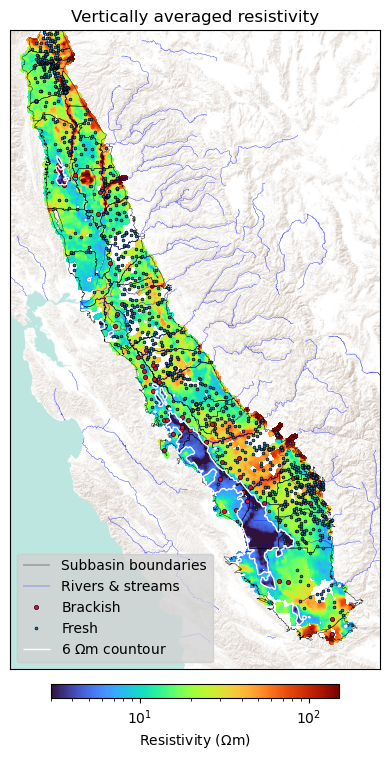

In [101]:
import matplotlib
matplotlib.rcParams['font.size'] = 10

fig, ax = plt.subplots(1,1, figsize=(4, 8))

xlim = (-235738.88808281758, 146356.82349804082)
ylim = (-372488.7201856468, 287608.05395729607)
show(src, ax=ax, alpha=1)
out = mesh_orig.plot_image(rho_avg_final, ax=ax, pcolor_opts={'norm':LogNorm(vmin=3, vmax=150), 'cmap':'turbo'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax)
cb.set_label("Resistivity ($\Omega$m)")
ax.set_title("Resistivity")
# gdf_brackish.plot(color='crimson', ax=ax, markersize=10, marker='o', edgecolor='k', markeredgewidth=1)
# gdf_fresh.plot(color='C0', ax=ax, markersize=10, marker='x')
gdf_subbasin.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
gdf_rivers_3310.plot(color='blue', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
ax.plot(xy_brackish[:,0], xy_brackish[:,1], 'o', color='crimson', ms=3, markeredgecolor='k', markeredgewidth=0.5, label="Brackish")
ax.plot(xy_fresh[:,0], xy_fresh[:,1], 'o', color='C0', ms=2, markeredgecolor='k', markeredgewidth=0.5, label="Fresh")

# ax.plot(0,0, 'k.', label="AEM locations", ms=1)
# ax.plot(xy_aem[::5,0], xy_aem[::5,1], 'k,', alpha=0.3)
gdf_rho_salinity.boundary.plot(color='w', linewidth=1, ax=ax, label='6 $\Omega$m countour')    
ax.set_xlim(xlim)
ax.set_ylim(ylim)    
ax.set_xticks([])
ax.set_yticks([])  
ax.set_xlabel("")
ax.set_ylabel("")    
# ax.axis('off')
ax.set_aspect(1)
ax.set_facecolor('lightgrey')
ax.legend(loc=3, facecolor='lightgrey')
ax.set_title("Vertically averaged resistivity")
plt.tight_layout()
plt.show()
# fig.savefig('2d_rho_map.png', dpi=300)

In [102]:
subbasin_names_inactive = np.array(['SUISUN-FAIRFIELD VALLEY', 'REDDING AREA - SOUTH BATTLE CREEK',
       'REDDING AREA - ANDERSON', 'REDDING AREA - ENTERPRISE',
       'REDDING AREA - MILLVILLE', 'REDDING AREA - BOWMAN',
       'SACRAMENTO VALLEY - BEND', 'SACRAMENTO VALLEY - WYANDOTTE CREEK',
       'SACRAMENTO VALLEY - ANTELOPE', 'SACRAMENTO VALLEY - SOUTH YUBA',
       'SACRAMENTO VALLEY - NORTH YUBA',
       'SACRAMENTO VALLEY - SOUTH AMERICAN',
       'SACRAMENTO VALLEY - LOS MOLINOS',
       'SAN JOAQUIN VALLEY - KETTLEMAN PLAIN',
       'SAN JOAQUIN VALLEY - WHITE WOLF',
       'SAN JOAQUIN VALLEY - PLEASANT VALLEY',
       'SAN JOAQUIN VALLEY - COSUMNES',
       'SAN JOAQUIN VALLEY - EAST CONTRA COSTA',
       'SAN JOAQUIN VALLEY - TRACY'], dtype=object)

In [103]:
gdf_basins_3310_cv = gpd.read_file("subbasins_cv_all.geojson")
gdf_basins_3310_cv = gdf_basins_3310_cv.clip(gdf_cv_3310)

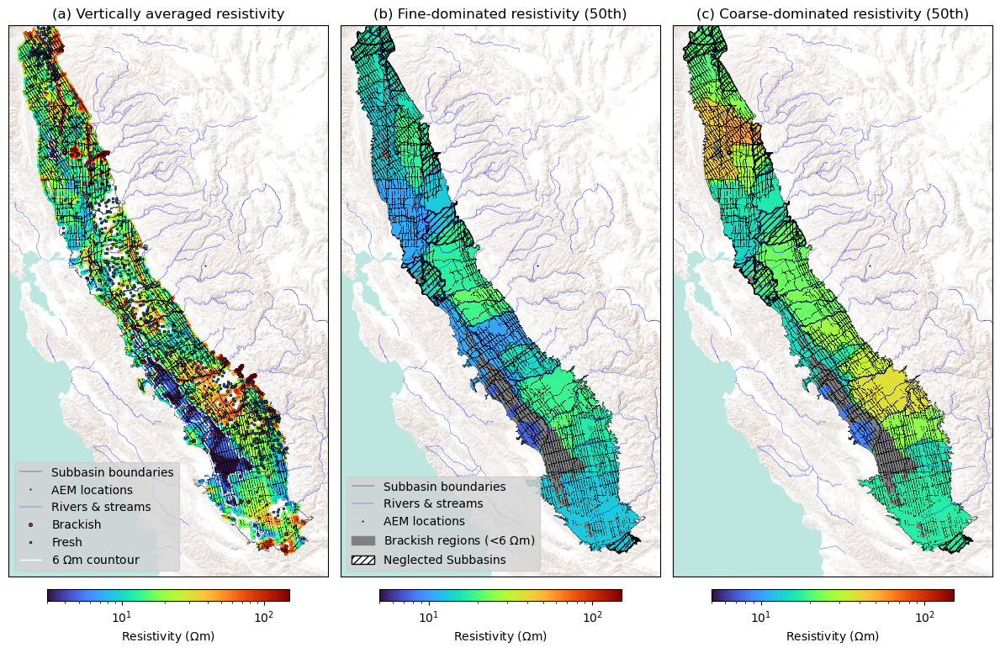

In [104]:
import matplotlib
matplotlib.rcParams['font.size'] = 10

fig, axs = plt.subplots(1,3, figsize=(12, 8))
ax, ax1, ax2 = axs
xlim = (-235738.88808281758, 146356.82349804082)
ylim = (-372488.7201856468, 287608.05395729607)
show(src, ax=ax, alpha=1)
show(src, ax=ax1, alpha=1)
show(src, ax=ax2, alpha=1)

out = mesh_orig.plot_image(rho_avg_final, ax=ax, pcolor_opts={'norm':LogNorm(vmin=3, vmax=150), 'cmap':'turbo'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax)
cb.set_label("Resistivity ($\Omega$m)")
ax.set_title("Resistivity")
gdf_subbasin.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
ax.plot(0,0, 'k.', label="AEM locations", ms=1)
gdf_rivers_3310.plot(color='blue', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
ax.plot(xy_brackish[:,0], xy_brackish[:,1], 'o', color='crimson', ms=3, markeredgecolor='k', markeredgewidth=0.5, label="Brackish")
ax.plot(xy_fresh[:,0], xy_fresh[:,1], 'o', color='C0', ms=2, markeredgecolor='k', markeredgewidth=0.5, label="Fresh")
gdf_rho_salinity.boundary.plot(color='w', linewidth=1, ax=ax, label='6 $\Omega$m countour')  
ax.plot(xy_aem[::5,0], xy_aem[::5,1], 'k,', alpha=0.3)


ax.set_xlim(xlim)
ax.set_ylim(ylim)    
ax.set_xticks([])
ax.set_yticks([])  
ax.set_xlabel("")
ax.set_ylabel("")    
# ax.axis('off')
ax.set_aspect(1)
ax.set_facecolor('lightgrey')
ax.legend(loc=3, facecolor='lightgrey')
ax.set_title("(a) Vertically averaged resistivity")

out = mesh_orig.plot_image(rho_fine_cv_grid_idw_final, ax=ax1, pcolor_opts={'norm':LogNorm(vmin=5, vmax=150), 'cmap':'turbo'})
cb1 = plt.colorbar(out[0], ax=ax1, orientation='horizontal', fraction=0.02, pad=0.02)
out = mesh_orig.plot_image(rho_coarse_cv_grid_idw_final, ax=ax2, pcolor_opts={'norm':LogNorm(vmin=5, vmax=150), 'cmap':'turbo'})
cb2 = plt.colorbar(out[0], ax=ax2, orientation='horizontal', fraction=0.02, pad=0.02)
cb1.set_label("Resistivity ($\Omega$m)")
cb2.set_label("Resistivity ($\Omega$m)")


for ii, ax in enumerate([ax1, ax2]):
    
    gdf_subbasin_cv.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
    gdf_basins_3310_cv.set_index('Basin_Su_1',inplace=False).loc[subbasin_names_inactive].plot(ax=ax, color='None', hatch='////')    
    gdf_rho_salinity.plot(ax=ax, legend=True, color='grey')
    ax.plot(xy_aem[::5,0], xy_aem[::5,1], 'k,', alpha=0.3)    
    gdf_rivers_3310.plot(color='blue', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
    ax.plot(0,0, 'k.', label="AEM locations", ms=1)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)    
    ax.set_xticks([])
    ax.set_yticks([])  
    ax.set_xlabel("")
    ax.set_ylabel("")    
    # ax.axis('off')
    ax.set_aspect(1)
    ax.set_facecolor('lightgrey')
ax1.fill(x, y, color='grey', label='Brackish regions (<6 $\Omega$m)')
ax1.fill_between((0,0), (1,1), color='w', hatch='////', label='Neglected Subbasins', edgecolors='k')
ax1.legend(loc=3, facecolor='lightgrey')
ax1.set_title("(b) Fine-dominated resistivity (50th)")
ax2.set_title("(c) Coarse-dominated resistivity (50th)")
plt.tight_layout()
plt.show()
fig.savefig('../figures/valley_wide_rock_physics.png', dpi=300)


<Axes: >

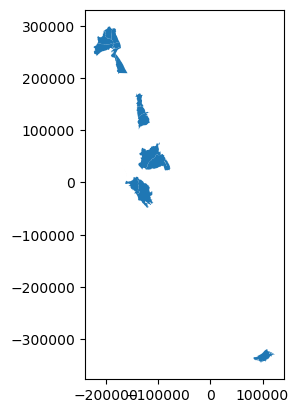

In [105]:
gdf_basins_3310_cv.set_index('Basin_Su_1',inplace=False).loc[subbasin_names_inactive].plot()

In [106]:
gdf_tmp = gdf_basins_3310_cv.set_index('Basin_Su_1',inplace=False).loc[subbasin_names_inactive]

In [107]:
gdf_tmp['area_square_km']

Basin_Su_1
SUISUN-FAIRFIELD VALLEY                    540.604279
REDDING AREA - SOUTH BATTLE CREEK          136.445044
REDDING AREA - ANDERSON                    399.444260
REDDING AREA - ENTERPRISE                  248.026081
REDDING AREA - MILLVILLE                   265.538680
REDDING AREA - BOWMAN                      495.876811
SACRAMENTO VALLEY - BEND                    91.768039
SACRAMENTO VALLEY - WYANDOTTE CREEK        240.311223
SACRAMENTO VALLEY - ANTELOPE                77.257709
SACRAMENTO VALLEY - SOUTH YUBA             441.194214
SACRAMENTO VALLEY - NORTH YUBA             246.204362
SACRAMENTO VALLEY - SOUTH AMERICAN        1005.251324
SACRAMENTO VALLEY - LOS MOLINOS            402.348991
SAN JOAQUIN VALLEY - KETTLEMAN PLAIN       258.005083
SAN JOAQUIN VALLEY - WHITE WOLF            435.206264
SAN JOAQUIN VALLEY - PLEASANT VALLEY       195.039721
SAN JOAQUIN VALLEY - COSUMNES              850.956656
SAN JOAQUIN VALLEY - EAST CONTRA COSTA     435.425930
SAN JOAQUIN VALLE

In [108]:
areas = []
for geom in gdf_tmp.geometry:
    areas.append(geom.area / 1e6)
areas = np.array(areas)    

In [109]:
areas.shape

(19,)

In [110]:
gdf_subbasin_cv.shape

(41, 5)

In [111]:
(areas > 200).sum()

13

(array([5., 1., 4., 1., 5., 0., 0., 0., 1., 2.]),
 array([1.75411518e-04, 1.00524354e+02, 2.01048532e+02, 3.01572710e+02,
        4.02096889e+02, 5.02621067e+02, 6.03145245e+02, 7.03669424e+02,
        8.04193602e+02, 9.04717780e+02, 1.00524196e+03]),
 <BarContainer object of 10 artists>)

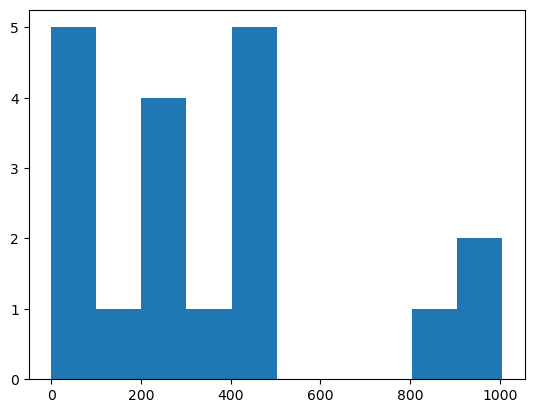

In [112]:
plt.hist(areas)

In [113]:
areas_all = []
for geom in gdf_subbasin_cv.geometry:
    areas_all.append(geom.area / 1e6)
areas_all = np.array(areas_all)    

In [114]:

areas.sum() / areas_all.sum()

0.1296802467762215

In [115]:
(areas_all > 50).sum()

38

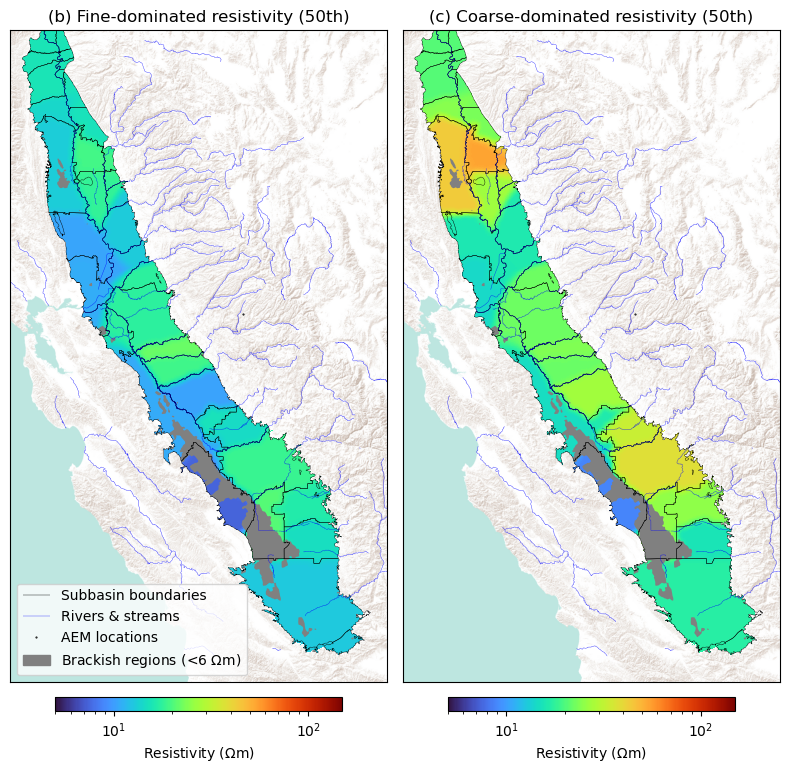

In [116]:
import matplotlib
matplotlib.rcParams['font.size'] = 10

fig, axs = plt.subplots(1,2, figsize=(8, 8))
ax1, ax2 = axs
xlim = (-235738.88808281758, 146356.82349804082)
ylim = (-372488.7201856468, 287608.05395729607)
show(src, ax=ax1, alpha=1)
show(src, ax=ax2, alpha=1)

out = mesh_orig.plot_image(rho_fine_cv_grid_idw_final, ax=ax1, pcolor_opts={'norm':LogNorm(vmin=5, vmax=150), 'cmap':'turbo'})
cb1 = plt.colorbar(out[0], ax=ax1, orientation='horizontal', fraction=0.02, pad=0.02)
out = mesh_orig.plot_image(rho_coarse_cv_grid_idw_final, ax=ax2, pcolor_opts={'norm':LogNorm(vmin=5, vmax=150), 'cmap':'turbo'})
cb2 = plt.colorbar(out[0], ax=ax2, orientation='horizontal', fraction=0.02, pad=0.02)
cb1.set_label("Resistivity ($\Omega$m)")
cb2.set_label("Resistivity ($\Omega$m)")


for ii, ax in enumerate(axs):
    
    gdf_subbasin_cv.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
    gdf_rho_salinity.plot(ax=ax, legend=True, color='grey')
    gdf_rivers_3310.plot(color='blue', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
    ax.plot(0,0, 'k.', label="AEM locations", ms=1)
    # ax.plot(xy_aem[::5,0], xy_aem[::5,1], 'k,', alpha=0.3)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)    
    ax.set_xticks([])
    ax.set_yticks([])  
    ax.set_xlabel("")
    ax.set_ylabel("")    
    # ax.axis('off')
    ax.set_aspect(1)
    ax.set_facecolor('lightgrey')
ax1.fill(x, y, color='grey', label='Brackish regions (<6 $\Omega$m)')    
ax1.legend(loc=3)
ax1.set_title("(b) Fine-dominated resistivity (50th)")
ax2.set_title("(c) Coarse-dominated resistivity (50th)")
plt.tight_layout()
plt.show()
# fig.savefig('../figures/valley_wide_rock_physics.png', dpi=300)


In [117]:
gdf_subbasin_cv.shape

(41, 5)

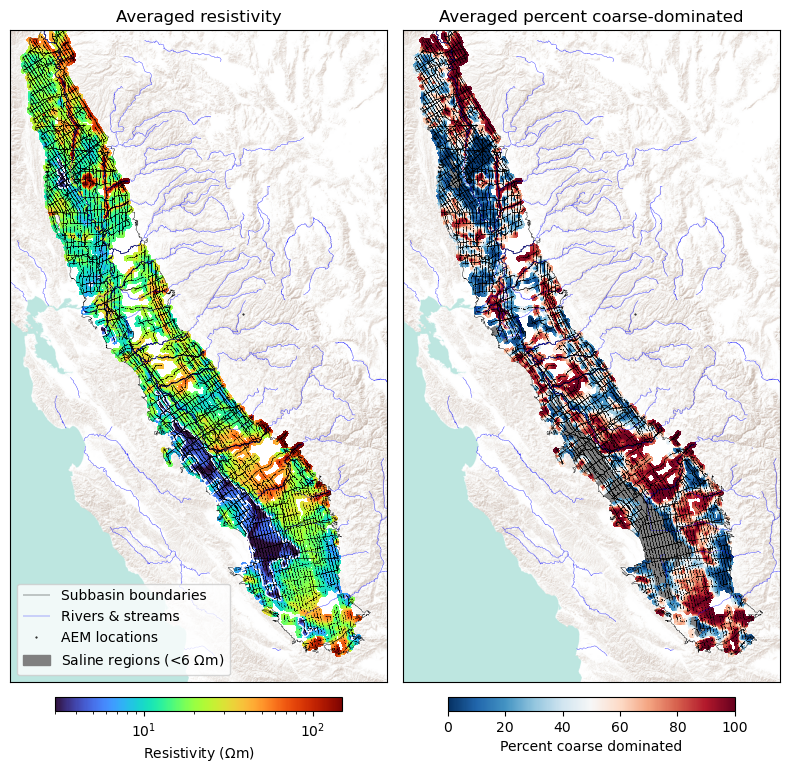

In [118]:
import matplotlib
matplotlib.rcParams['font.size'] = 10

fig, axs = plt.subplots(1,2, figsize=(8, 8))
ax1, ax2 = axs
xlim = (-235738.88808281758, 146356.82349804082)
ylim = (-372488.7201856468, 287608.05395729607)
show(src, ax=ax1, alpha=1)
show(src, ax=ax2, alpha=1)

out = mesh_orig.plot_image(rho_avg_final, ax=ax1, pcolor_opts={'norm':LogNorm(vmin=3, vmax=150), 'cmap':'turbo'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax1)
cb.set_label("Resistivity ($\Omega$m)")
ax1.set_title("Resistivity")

out = mesh_orig.plot_image(fc_final*100, ax=ax2, pcolor_opts={'cmap':'RdBu_r'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax2)
cb.set_label("Percent coarse dominated")
ax2.set_title("Percent coarse-dominated")


for ii, ax in enumerate(axs):
    
    gdf_subbasin.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
    if ii==1:
        gdf_rho_salinity.plot(ax=ax, legend=True, color='grey')
    else:
        gdf_rho_salinity.boundary.plot(color='w', linewidth=1, ax=ax)    
    gdf_rivers_3310.plot(color='blue', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
    ax.plot(0,0, 'k.', label="AEM locations", ms=1)
    ax.plot(xy_aem[::5,0], xy_aem[::5,1], 'k,', alpha=0.3)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)    
    ax.set_xticks([])
    ax.set_yticks([])  
    ax.set_xlabel("")
    ax.set_ylabel("")    
    # ax.axis('off')
    ax.set_aspect(1)
    ax.set_facecolor('lightgrey')
ax1.fill(x, y, color='grey', label='Saline regions (<6 $\Omega$m)')    
ax1.legend(loc=3)
ax1.set_title("Averaged resistivity")
ax2.set_title("Averaged percent coarse-dominated")
plt.tight_layout()
plt.show()
fig.savefig('2d_rho_fcd_maps.png', dpi=300)


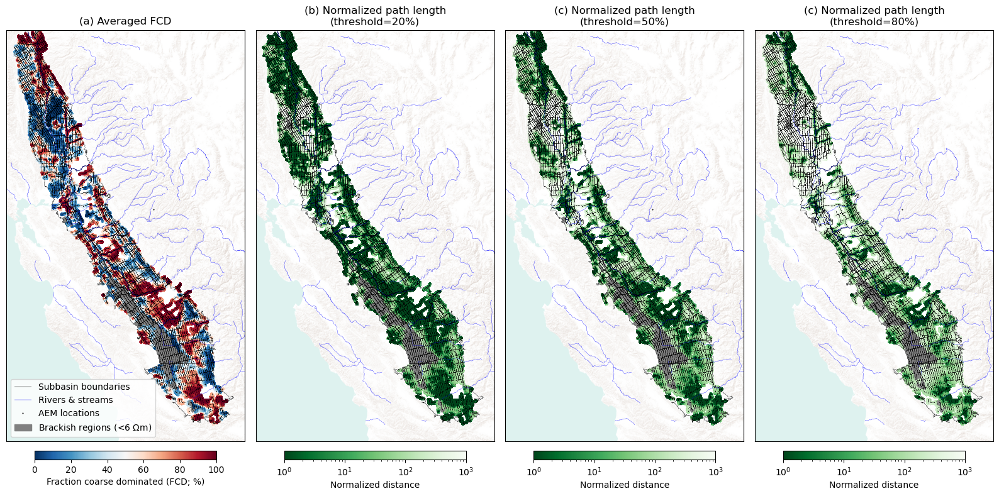

In [200]:
import matplotlib
matplotlib.rcParams['font.size'] = 10

fig, axs = plt.subplots(1,4, figsize=(16, 8))
ax1, ax2, ax3, ax4 = axs
xlim = (-235738.88808281758, 146356.82349804082)
ylim = (-372488.7201856468, 287608.05395729607)
for ax in axs:
    show(src, ax=ax, alpha=0.5)



out = mesh_orig.plot_image(fc_final*100, ax=ax1, pcolor_opts={'cmap':'RdBu_r'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax1)
cb.set_label("Fraction coarse dominated (FCD; %)")
ax1.set_title("(a) Averaged FCD")

out = mesh_orig.plot_image(path_length_20_norm_final, ax=ax2, pcolor_opts={'cmap':'Greens_r', 'norm':LogNorm(vmin=1, vmax=1000)})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax2)
cb.set_label("Normalized distance")
ax2.set_title("(b) Normalized path length\n(threshold=20%)")

out = mesh_orig.plot_image(path_length_30_norm_final, ax=ax3, pcolor_opts={'cmap':'Greens_r', 'norm':LogNorm(vmin=1, vmax=1000)})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax3)
cb.set_label("Normalized distance")
ax3.set_title("(c) Normalized path length\n(threshold=50%)")

out = mesh_orig.plot_image(path_length_40_norm_final, ax=ax4, pcolor_opts={'cmap':'Greens_r', 'norm':LogNorm(vmin=1, vmax=1000)})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax4)
cb.set_label("Normalized distance")
ax4.set_title("(c) Normalized path length\n(threshold=80%)")



for ax in axs:
    gdf_subbasin_cv.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
    gdf_rho_salinity.plot(ax=ax, legend=True, color='grey')
    # gdf_cv_3310.boundary.plot(color='k', linewidth=0.3, ax=ax, label='CV boundary')    
    gdf_rivers_3310.plot(color='blue', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
    ax.plot(0,0, 'k.', label="AEM locations", ms=1)
    ax.plot(xy_aem[::5,0], xy_aem[::5,1], 'k,', alpha=0.3)
    ax.set_xticks([])
    ax.set_yticks([])  
    ax.set_xlabel("")
    ax.set_ylabel("")    
    # ax.axis('off')
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_aspect(1)
ax1.fill(x, y, color='grey', label='Brackish regions (<6 $\Omega$m)')    
ax1.legend(loc=3)
plt.tight_layout()
plt.show()
fig.savefig('../figures/2d_metric_path_length.png', dpi=300)

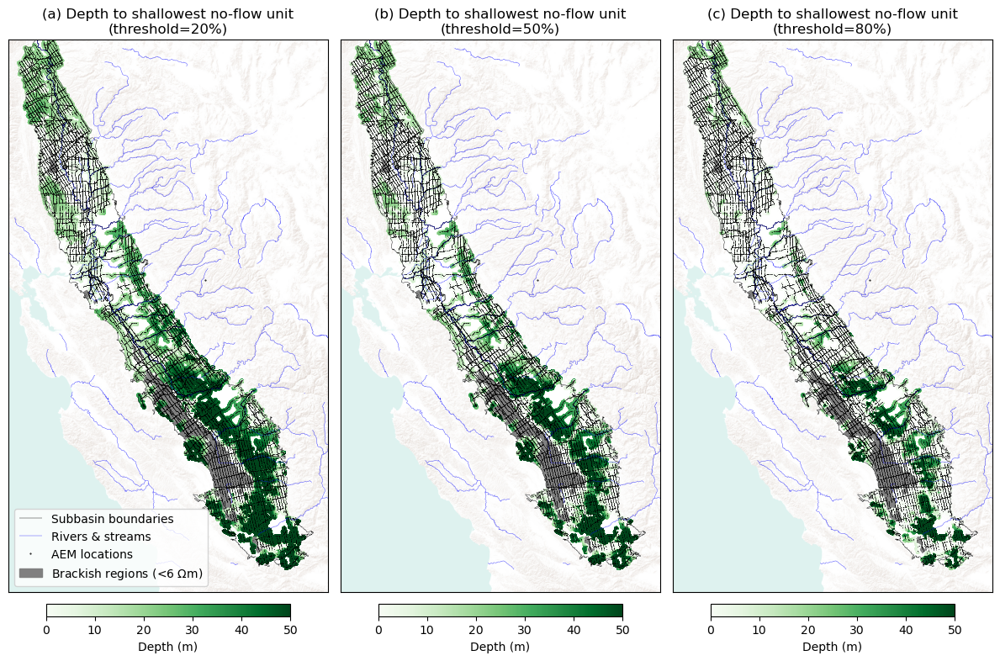

In [224]:
import matplotlib
matplotlib.rcParams['font.size'] = 10

fig, axs = plt.subplots(1,3, figsize=(12, 8))
ax1, ax2, ax3, = axs
xlim = (-235738.88808281758, 146356.82349804082)
ylim = (-372488.7201856468, 287608.05395729607)
for ax in axs:
    show(src, ax=ax, alpha=0.5)


out = mesh_orig.plot_image(path_to_no_flow_20_final, ax=ax1, pcolor_opts={'clim':(0, 50), 'cmap':'Greens'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax1)
cb.set_label("Depth (m)")
ax1.set_title("(a) Depth to shallowest no-flow unit\n(threshold=20%)")


out = mesh_orig.plot_image(path_to_no_flow_30_final, ax=ax2, pcolor_opts={'clim':(0, 50), 'cmap':'Greens'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax2)
cb.set_label("Depth (m)")
ax2.set_title("(b) Depth to shallowest no-flow unit\n(threshold=50%)")

out = mesh_orig.plot_image(path_to_no_flow_40_final, ax=ax3, pcolor_opts={'clim':(0, 50), 'cmap':'Greens'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax3)
cb.set_label("Depth (m)")
ax3.set_title("(c) Depth to shallowest no-flow unit\n(threshold=80%)")



for ax in axs:
    gdf_subbasin_cv.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
    gdf_rho_salinity.plot(ax=ax, legend=True, color='grey')
    # gdf_cv_3310.boundary.plot(color='k', linewidth=0.3, ax=ax, label='CV boundary')    
    gdf_rivers_3310.plot(color='blue', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
    ax.plot(0,0, 'k.', label="AEM locations", ms=1)
    ax.plot(xy_aem[::5,0], xy_aem[::5,1], 'k,', alpha=0.3)
    ax.set_xticks([])
    ax.set_yticks([])  
    ax.set_xlabel("")
    ax.set_ylabel("")    
    # ax.axis('off')
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_aspect(1)
ax1.fill(x, y, color='grey', label='Brackish regions (<6 $\Omega$m)')    
ax1.legend(loc=3)
plt.tight_layout()
plt.show()
fig.savefig('../figures/2d_metric_depth_to_shallowest.png', dpi=300)

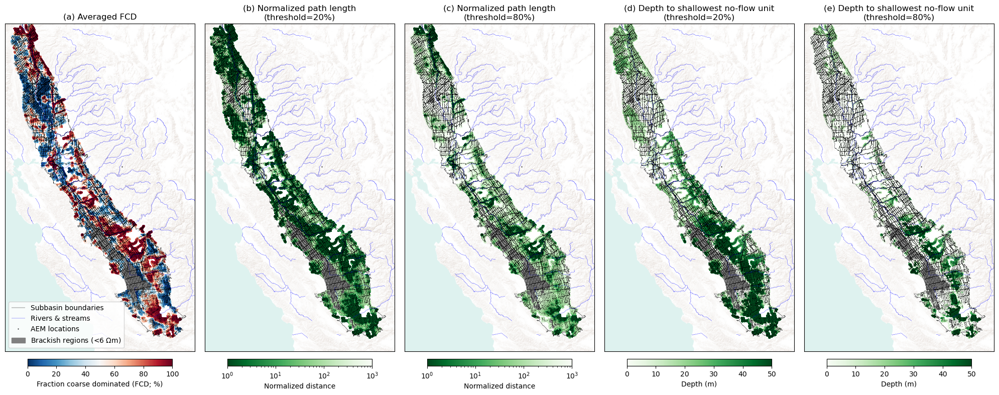

In [119]:
import matplotlib
matplotlib.rcParams['font.size'] = 10

fig, axs = plt.subplots(1,5, figsize=(20, 8))
ax1, ax2, ax3, ax4, ax5 = axs
xlim = (-235738.88808281758, 146356.82349804082)
ylim = (-372488.7201856468, 287608.05395729607)
for ax in axs:
    show(src, ax=ax, alpha=0.5)



out = mesh_orig.plot_image(fc_final*100, ax=ax1, pcolor_opts={'cmap':'RdBu_r'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax1)
cb.set_label("Fraction coarse dominated (FCD; %)")
ax1.set_title("(a) Averaged FCD")

out = mesh_orig.plot_image(path_length_20_norm_final, ax=ax2, pcolor_opts={'cmap':'Greens_r', 'norm':LogNorm(vmin=1, vmax=1000)})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax2)
cb.set_label("Normalized distance")
ax2.set_title("(b) Normalized path length\n(threshold=20%)")

out = mesh_orig.plot_image(path_length_40_norm_final, ax=ax3, pcolor_opts={'cmap':'Greens_r', 'norm':LogNorm(vmin=1, vmax=1000)})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax3)
cb.set_label("Normalized distance")
ax3.set_title("(c) Normalized path length\n(threshold=80%)")

out = mesh_orig.plot_image(path_to_no_flow_20_final, ax=ax4, pcolor_opts={'clim':(0, 50), 'cmap':'Greens'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax4)
cb.set_label("Depth (m)")
ax4.set_title("(d) Depth to shallowest no-flow unit\n(threshold=20%)")

out = mesh_orig.plot_image(path_to_no_flow_40_final, ax=ax5, pcolor_opts={'clim':(0, 50), 'cmap':'Greens'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax5)
cb.set_label("Depth (m)")
ax5.set_title("(e) Depth to shallowest no-flow unit\n(threshold=80%)")



for ax in axs:
    gdf_subbasin_cv.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
    gdf_rho_salinity.plot(ax=ax, legend=True, color='grey')
    # gdf_cv_3310.boundary.plot(color='k', linewidth=0.3, ax=ax, label='CV boundary')    
    gdf_rivers_3310.plot(color='blue', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
    ax.plot(0,0, 'k.', label="AEM locations", ms=1)
    ax.plot(xy_aem[::5,0], xy_aem[::5,1], 'k,', alpha=0.3)
    ax.set_xticks([])
    ax.set_yticks([])  
    ax.set_xlabel("")
    ax.set_ylabel("")    
    # ax.axis('off')
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_aspect(1)
ax1.fill(x, y, color='grey', label='Brackish regions (<6 $\Omega$m)')    
ax1.legend(loc=3)
plt.tight_layout()
plt.show()
fig.savefig('../figures/2d_metric.png', dpi=300)

In [205]:
inds_all = np.logical_and(fc_final.data>0.7, path_length_40_norm_final.data<10., path_to_no_flow_40_final.data>20.)
final_binary_metric_up = inds_all.astype(float)
final_binary_metric_up = ma.masked_array(data=final_binary_metric_up, mask=fc_final.mask)

In [206]:
inds_all = np.logical_and(fc_final.data>0.5, path_length_30_norm_final.data<10., path_to_no_flow_30_final.data>20.)
final_binary_metric_mid = inds_all.astype(float)
final_binary_metric_mid = ma.masked_array(data=final_binary_metric_mid, mask=fc_final.mask)

In [207]:
inds_all = np.logical_and(fc_final.data>0.2, path_length_20_norm_final.data<10., path_to_no_flow_20_final.data>20.)
final_binary_metric_low = inds_all.astype(float)
final_binary_metric_low = ma.masked_array(data=final_binary_metric_low, mask=fc_final.mask)

In [208]:
np.percentile(fc_final.data[~fc_final.mask], 75)

0.807798897491884

In [209]:
import matplotlib.colors
binary_cmap = matplotlib.colors.ListedColormap(['white', 'green'])

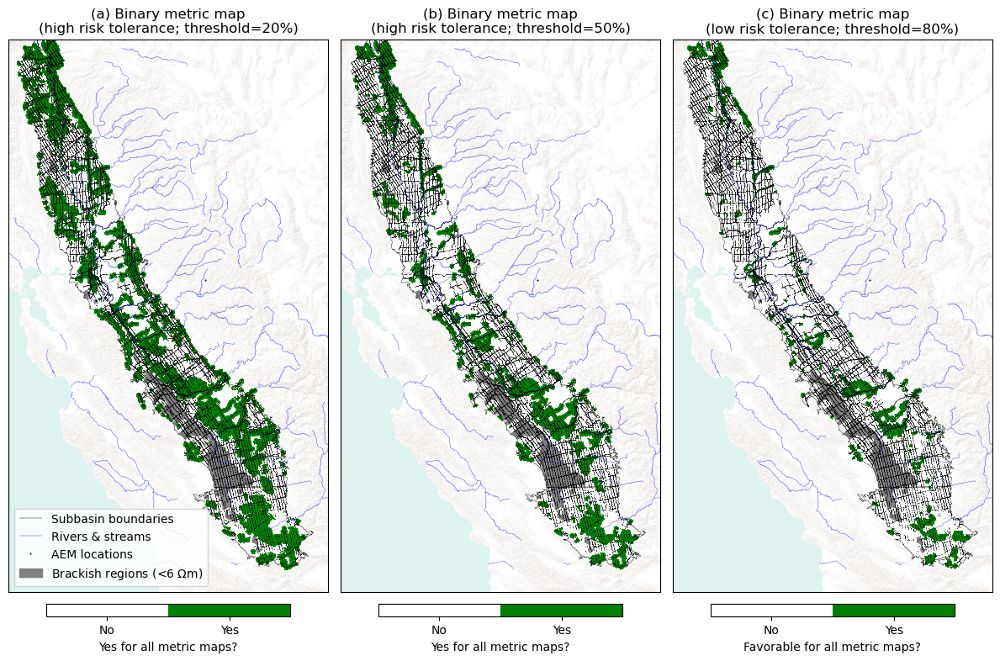

In [223]:
import matplotlib
matplotlib.rcParams['font.size'] = 10

fig, axs = plt.subplots(1,3, figsize=(12, 8))
ax1, ax2, ax3 = axs
xlim = (-235738.88808281758, 146356.82349804082)
ylim = (-372488.7201856468, 287608.05395729607)
for ax in axs:
    show(src, ax=ax, alpha=0.5)


out = mesh_orig.plot_image(final_binary_metric_low, ax=ax1, pcolor_opts={'clim':(0, 1), 'cmap':binary_cmap})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax1)
cb.set_ticks([0.25, 0.75])
cb.set_ticklabels(["No", "Yes"])
cb.set_label("Yes for all metric maps?")
ax1.set_title("(a) Binary metric map\n(high risk tolerance; threshold=20%)")

out = mesh_orig.plot_image(final_binary_metric_mid, ax=ax2, pcolor_opts={'clim':(0, 1), 'cmap':binary_cmap})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax2)
cb.set_ticks([0.25, 0.75])
cb.set_ticklabels(["No", "Yes"])
cb.set_label("Yes for all metric maps?")
ax2.set_title("(b) Binary metric map\n(high risk tolerance; threshold=50%)")


out = mesh_orig.plot_image(final_binary_metric_up, ax=ax3, pcolor_opts={'clim':(0, 1), 'cmap':binary_cmap})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax3)
cb.set_ticks([0.25, 0.75])
cb.set_ticklabels(["No", "Yes"])
cb.set_label("Favorable for all metric maps?")
ax3.set_title("(c) Binary metric map\n(low risk tolerance; threshold=80%)")



for ax in axs:
    gdf_subbasin_cv.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
    gdf_rho_salinity.plot(ax=ax, legend=True, color='grey')
    # gdf_cv_3310.boundary.plot(color='k', linewidth=0.3, ax=ax, label='CV boundary')    
    gdf_rivers_3310.plot(color='blue', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
    ax.plot(0,0, 'k.', label="AEM locations", ms=1)
    ax.plot(xy_aem[::5,0], xy_aem[::5,1], 'k,', alpha=0.3)
    ax.set_xticks([])
    ax.set_yticks([])  
    ax.set_xlabel("")
    ax.set_ylabel("")    
    # ax.axis('off')
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_aspect(1)
ax1.fill(x, y, color='grey', label='Brackish regions (<6 $\Omega$m)')    
ax1.legend(loc=3)
plt.tight_layout()
plt.show()
fig.savefig('../figures/2d_binary_maps.png', dpi=300)

In [125]:
# import matplotlib
# matplotlib.rcParams['font.size'] = 10

# fig, axs = plt.subplots(1,3, figsize=(12, 8))
# ax1, ax2, ax3 = axs
# xlim = (-235738.88808281758, 146356.82349804082)
# ylim = (-372488.7201856468, 287608.05395729607)
# show(src, ax=ax1, alpha=0.5)
# show(src, ax=ax2, alpha=0.5)
# show(src, ax=ax3, alpha=0.5)

# out = mesh_orig.plot_image(fc_final, ax=ax1, pcolor_opts={'cmap':'RdBu_r'})
# cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax1)
# cb.set_label("Fraction coarse-dominated (FCD)")
# ax1.set_title("Averaged FCD")


# out = mesh_orig.plot_image(path_length_10_norm_final, ax=ax2, clim=(1, 100), pcolor_opts={'cmap':'Greens_r'})
# cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax2)
# cb.set_label("Normalized distance")
# ax2.set_title("Normalized path length")

# out = mesh_orig.plot_image(path_to_no_flow_10_final, ax=ax3, clim=(1, 100),pcolor_opts={'cmap':'Greens'})
# cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax3)
# cb.set_label("Depth (m)")
# ax3.set_title("Depth to shallowest no-flow unit")


# for ax in axs:
#     gdf_subbasin.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
#     gdf_rho_salinity.plot(ax=ax, legend=True, color='grey')
#     # gdf_cv_3310.boundary.plot(color='k', linewidth=0.3, ax=ax, label='CV boundary')    
#     gdf_rivers_3310.plot(color='blue', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
#     ax.plot(0,0, 'k.', label="AEM locations", ms=1)
#     ax.plot(xy_aem[::5,0], xy_aem[::5,1], 'k,', alpha=0.3)
#     ax.set_xticks([])
#     ax.set_yticks([])  
#     ax.set_xlabel("")
#     ax.set_ylabel("")    
#     # ax.axis('off')
#     ax.set_xlim(xlim)
#     ax.set_ylim(ylim)
#     ax.set_aspect(1)
# ax1.fill(x, y, color='grey', label='Saline regions (<6 $\Omega$m)')    
# ax1.legend(loc=3)
# plt.tight_layout()
# plt.show()
# # fig.savefig('../figures/2d_path_maps.png', dpi=300)

In [126]:
# fig, ax = plt.subplots(1,1, figsize=(3, 10))
# out = mesh.plot_image(path_to_no_flow, ax=ax, pcolor_opts={'cmap':'Greens_r'})
# cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.01, pad=0.02)
# cb.set_label("Distance (m)")
# ax.set_title("Path length")

# ax.plot(xy_aem_rot[::10,0], xy_aem_rot[::10,1], 'k,', alpha=0.1)
# ax.set_xticks([])
# ax.set_yticks([])  
# ax.set_xlabel("")
# ax.set_ylabel("")    
# # ax.axis('off')
# ax.set_aspect(1)
# ax.set_facecolor('lightgrey')
# plt.tight_layout()

In [127]:
nx, ny = mesh_orig.vnC

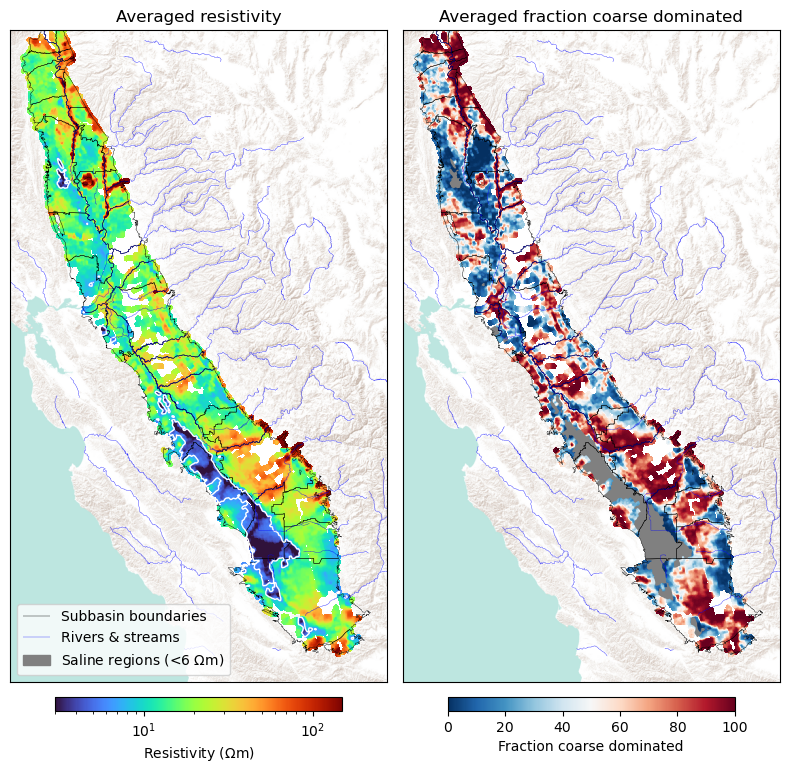

In [128]:
import matplotlib
matplotlib.rcParams['font.size'] = 10

fig, axs = plt.subplots(1,2, figsize=(8, 8))
ax1, ax2 = axs
xlim = (-235738.88808281758, 146356.82349804082)
ylim = (-372488.7201856468, 287608.05395729607)
show(src, ax=ax1, alpha=1)
show(src, ax=ax2, alpha=1)

out = mesh_orig.plot_image(rho_avg_final, ax=ax1, pcolor_opts={'norm':LogNorm(vmin=3, vmax=150), 'cmap':'turbo'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax1)
cb.set_label("Resistivity ($\Omega$m)")
ax1.set_title("Resistivity")

out = mesh_orig.plot_image(fc_final*100, ax=ax2, pcolor_opts={'cmap':'RdBu_r'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax2)
cb.set_label("Fraction coarse dominated")
ax2.set_title("Fraction coarse-dominated")


for ii, ax in enumerate(axs):
    
    gdf_subbasin.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
    if ii==1:
        gdf_rho_salinity.plot(ax=ax, legend=True, color='grey')
    else:
        gdf_rho_salinity.boundary.plot(color='w', linewidth=1, ax=ax)    
    gdf_rivers_3310.plot(color='blue', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
    # ax.plot(xy_aem[::10,0], xy_aem[::10,1], 'k,', alpha=0.1)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)    
    ax.set_xticks([])
    ax.set_yticks([])  
    ax.set_xlabel("")
    ax.set_ylabel("")    
    # ax.axis('off')
    ax.set_aspect(1)
    ax.set_facecolor('lightgrey')
ax1.fill(x, y, color='grey', label='Saline regions (<6 $\Omega$m)')    
ax1.legend(loc=3)
ax1.set_title("Averaged resistivity")
ax2.set_title("Averaged fraction coarse dominated")
plt.tight_layout()
plt.show()
fig.savefig('2d_rho_fcd_maps.png', dpi=300)


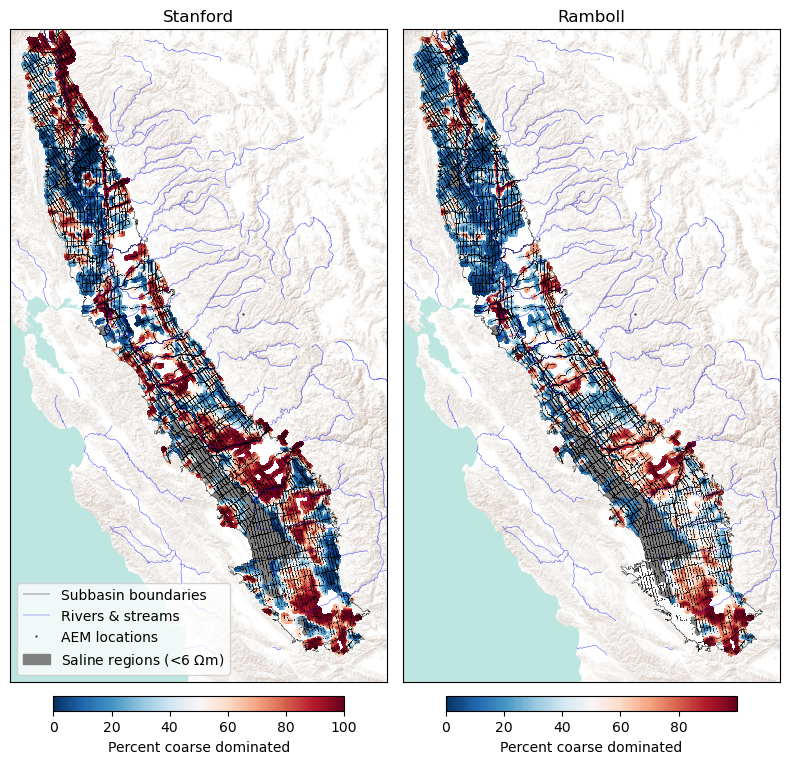

In [129]:
import matplotlib
matplotlib.rcParams['font.size'] = 10

fig, axs = plt.subplots(1,2, figsize=(8, 8))
ax1, ax2 = axs
xlim = (-235738.88808281758, 146356.82349804082)
ylim = (-372488.7201856468, 287608.05395729607)
show(src, ax=ax1, alpha=1)
show(src, ax=ax2, alpha=1)

out = mesh_orig.plot_image(fc_final*100, ax=ax1, pcolor_opts={'cmap':'RdBu_r'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax1)
cb.set_label("Percent coarse dominated")

out = mesh_orig.plot_image(fc_avg_cdwr*100, ax=ax2, pcolor_opts={'cmap':'RdBu_r'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax2)
cb.set_label("Percent coarse dominated")
ax1.set_title("Stanford")
ax2.set_title("Ramboll")


for ii, ax in enumerate(axs):
    
    gdf_subbasin.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
    gdf_rho_salinity.plot(ax=ax, legend=True, color='grey')
    gdf_rivers_3310.plot(color='blue', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
    ax.plot(0,0, 'k.', label="AEM locations", ms=1)
    ax.plot(xy_aem[::5,0], xy_aem[::5,1], 'k,', alpha=0.3)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)    
    ax.set_xticks([])
    ax.set_yticks([])  
    ax.set_xlabel("")
    ax.set_ylabel("")    
    # ax.axis('off')
    ax.set_aspect(1)
    ax.set_facecolor('lightgrey')
ax1.fill(x, y, color='grey', label='Saline regions (<6 $\Omega$m)')    
ax1.legend(loc=3)
plt.tight_layout()
plt.show()
fig.savefig('2d_fcd_maps.png', dpi=300)


In [130]:
gdf_1 = gpd.read_file("../data/shp/alluvial_fan/chowchila.geojson")
gdf_2 = gpd.read_file("../data/shp/alluvial_fan/fresno.geojson")
gdf_3 = gpd.read_file("../data/shp/alluvial_fan/kaweah.geojson")
gdf_4 = gpd.read_file("../data/shp/alluvial_fan/kings.geojson")
gdf_1 = gdf_1.append(gdf_2)
gdf_1 = gdf_1.append(gdf_3)
gdf_1 = gdf_1.append(gdf_4)
gdf_fan = gdf_1.to_crs(3310)

In [131]:
gdf_fan.to_file("../data/shp/alluvial_fan/alluvial_fan.geojson")

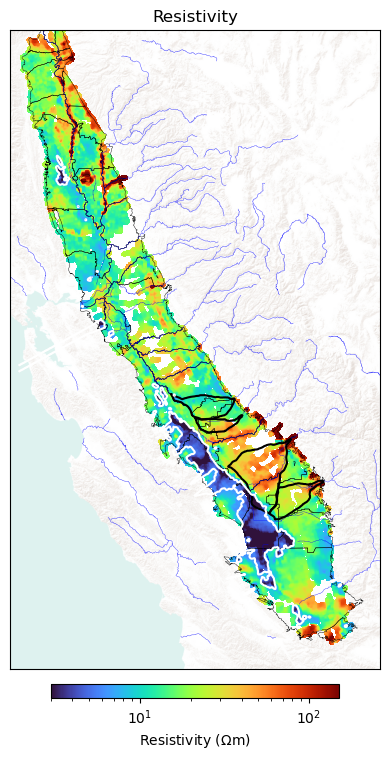

In [132]:
import matplotlib
matplotlib.rcParams['font.size'] = 10
tmp = rho_avg_final.data.reshape((nx, ny), order='F')
fig, ax = plt.subplots(1,1, figsize=(4, 8))
xlim = (-235738.88808281758, 146356.82349804082)
ylim = (-372488.7201856468, 287608.05395729607)
show(src, ax=ax, alpha=0.5)
out = mesh_orig.plot_image(rho_avg_final, ax=ax, pcolor_opts={'norm':LogNorm(vmin=3, vmax=150), 'cmap':'turbo'})
gdf_subbasin.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax)
cb.set_label("Resistivity ($\Omega$m)")
ax.set_title("Resistivity")
gdf_rivers_3310.plot(color='b', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
gdf_fan.boundary.plot(color='k', ax=ax)
cs = ax.contour(mesh_orig.cell_centers_x, mesh_orig.cell_centers_y, tmp.T, levels=[6.], colors=['w'])

# ax.plot(xy_aem[::10,0], xy_aem[::10,1], 'k,', alpha=0.1)
ax.set_xlim(xlim)
ax.set_ylim(ylim)    
ax.set_xticks([])
ax.set_yticks([])  
ax.set_xlabel("")
ax.set_ylabel("")    
ax.set_aspect(1)
plt.tight_layout()
fig.savefig("avg_rho.png", dpi=300)

In [133]:
from shapely import Polygon
def create_gpd_dataframe_from_contours(
    cs, input_crs, output_crs, spatial_conversion, dx, dy
):
    geometry = []
    index = []
    i_count = 0
    for cnt in cs.collections:
        n = len(cnt.get_paths())
        for ii in range(n):
            vs = cnt.get_paths()[ii].vertices
            vs = np.c_[vs[:, 0] - dx / 2, vs[:, 1] - dy / 2] / spatial_conversion
            polygon_geom = Polygon(vs)
            geometry.append(polygon_geom)
            index.append(i_count)
            i_count += 1
    polyline = gpd.GeoDataFrame(index=index, crs=input_crs, geometry=geometry)
    polyline = polyline.to_crs(crs=output_crs)
    return polyline

In [134]:
polyline = create_gpd_dataframe_from_contours(cs, 3310, 3310, 1., 400, 400)

In [135]:
geoms = [] 

In [136]:
polyline_clip = polyline.clip(gdf_cv_3310)

In [137]:
polyline_clip.to_file("resistivity_contours_6ohmm.geojson")

<Axes: >

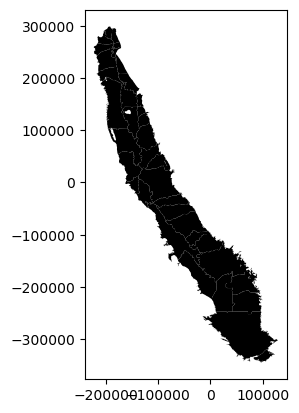

In [138]:
fig, ax = plt.subplots(1,1)
gdf_subbasin.plot(color='k', linewidth=0.3, label='Subbasin boundaries', ax=ax)
# ax.plot(xy_pts_cvhm_3310[:,0], xy_pts_cvhm_3310[:,1], 'r,')


In [139]:
gdf_aem = gpd.GeoDataFrame({}, geometry=gpd.points_from_xy(xy_aem[:,0], xy_aem[:,1]), crs=3310)

In [140]:
gdf_aem_clip = gdf_aem.clip(gdf_subbasin)

In [141]:
gdf_aem_clip_salinity = gdf_aem.clip(polyline_clip)

In [142]:
inds_active_aem = np.array(list(gdf_aem_clip.index))

In [143]:
inds_active_aem.shape

(375919,)

In [144]:
inds_active_aem_salinity = np.array(list(gdf_aem_clip_salinity.index))

In [145]:
inds_active_aem_all = np.zeros(xy_aem.shape[0], dtype=bool)
inds_active_aem_all[inds_active_aem] = True
inds_active_aem_all[inds_active_aem_salinity] = False

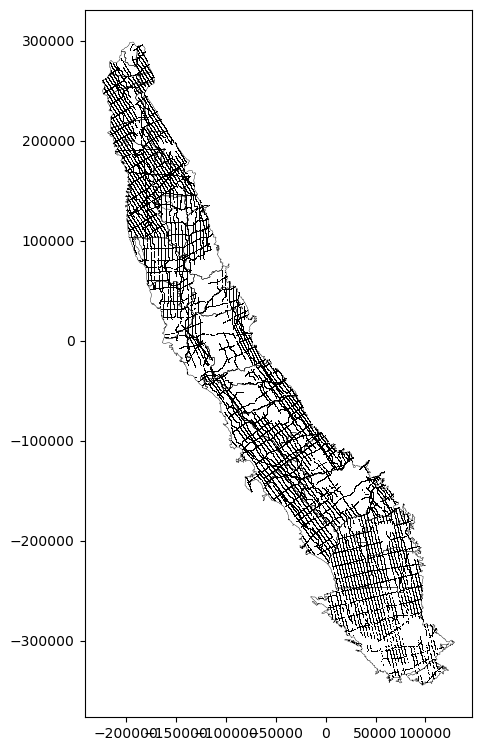

In [146]:
fig, ax = plt.subplots(1,1, figsize=(5,15))
gdf_subbasin.boundary.plot(color='k', linewidth=0.3, label='Subbasin boundaries', ax=ax)
ax.plot(xy_aem[:,0], xy_aem[:,1], 'k,')
# ax.plot(xy_pts_cvhm_3310[:,0], xy_pts_cvhm_3310[:,1], 'r,')



In [147]:
np.save("inds_active_aem.npy",inds_active_aem_all)

## Compare with CVHM

In [148]:
from pyproj import Proj, transform
name = "+proj=aea +lat_0=23 +lon_0=-120 +lat_1=29.5 +lat_2=45.5 +x_0=0 +y_0=0 +datum=NAD83 +no_defs +type=crs +units=m"
epsg_cvhm = Proj(name)
epsg_3310 = Proj(init='EPSG:3310')


In [149]:
df = pd.read_excel("../data/texture_cvhm/well-log-texture.xls", sheet_name="%coarse_wells_15m_increments", skiprows=1)


In [150]:
df_grouop = df.groupby('ID')

In [151]:
xy_pts_cvhm = df_grouop[['POINT_X', 'POINT_Y']].median().values

In [152]:
df_model = pd.read_excel("../data/texture_cvhm/well-log-texture.xls", sheet_name="cvhm_txt_lattice", skiprows=1)
x_cvhm, y_cvhm = transform(epsg_cvhm, epsg_3310, df_model['X_COORD'].values, df_model['Y_COORD'].values)
xy_cvhm  = np.c_[x_cvhm, y_cvhm]



In [153]:
x_pts_cvhm, y_pts_cvhm = transform(epsg_cvhm, epsg_3310, xy_pts_cvhm[:,0], xy_pts_cvhm[:,1])
xy_pts_cvhm_3310  = np.c_[x_pts_cvhm, y_pts_cvhm]


In [154]:
columns = np.array(list(df_model.keys()))
inds_pc = np.array(['PC' in col for col in columns])

In [155]:
columns_pc = columns[inds_pc]

In [156]:
# for col in columns_pc:
#     print(col, len(df_model[col]))

In [157]:
# 50 ft regular vertical interval
hz_cvhm = np.ones(len(columns_pc)) * 50 *0.3048 

In [158]:
mesh_1d_cvhm = TensorMesh([hz_cvhm])

In [159]:
tree_cvhm = kdtree(xy_cvhm)
k_nearest_points = 10
d_cvhm, inds_idw_cvhm = tree_cvhm.query(xy_grid_orig, k=int(k_nearest_points))
dx, dy = 400, 400
epsilon = np.min([dx, dy])
power = 1.
w_cvhm = 1.0 / ((d_cvhm + epsilon) ** power)

In [160]:
base_cvhm = f_base(xy_cvhm)

In [161]:
ZCV = np.tile(mesh_1d_cvhm.cell_centers, (20533, 1))
ZCV_base = np.tile(base_cvhm, (len(hz_cvhm), 1)).T
HZCV = np.tile(hz_cvhm, (20533, 1))
HZCV[ZCV>ZCV_base] = 0.

In [162]:
FCD_CV = df_model[columns_pc].values

In [163]:
fc_cvhm_avg = (FCD_CV[:,:] * HZCV[:,:]).sum(axis=1) / HZCV[:,:].sum(axis=1)
fc_cvhm_avg_int = idw_interpolation(fc_cvhm_avg, w_cvhm, inds_idw_cvhm)
fc_cvhm_avg_int = ma.masked_array(fc_cvhm_avg_int, mask=mask_inds_final)

In [164]:
import matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.inset_locator import inset_axes

from scipy import stats
x_tmp = fc_final.data[mask_inds_final_active].copy()
y_tmp = fc_cvhm_avg_int.data[mask_inds_final_active]*0.01
z_tmp = fc_avg_cdwr.data[mask_inds_final_active].copy()

In [165]:
print(np.percentile(fc_cvhm_avg_int.data, 1), np.percentile(fc_cvhm_avg_int.data, 99))

17.601025975295666 56.88626456121573


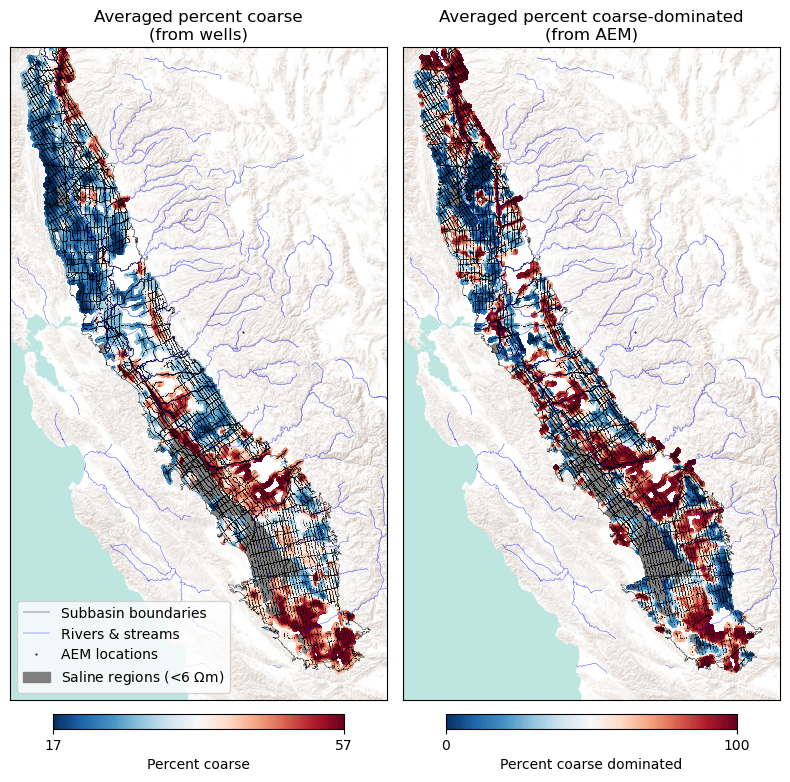

In [166]:
import matplotlib
matplotlib.rcParams['font.size'] = 10

fig, axs = plt.subplots(1,2, figsize=(8, 8))
ax1, ax2 = axs
xlim = (-235738.88808281758, 146356.82349804082)
ylim = (-372488.7201856468, 287608.05395729607)
show(src, ax=ax1, alpha=1)
show(src, ax=ax2, alpha=1)

out = mesh_orig.plot_image(fc_cvhm_avg_int, ax=ax1, pcolor_opts={'cmap':'RdBu_r'}, clim=(17, 57))
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax1)
cb.set_label("Percent coarse")
cb.set_ticks([17,57])
ax1.set_title("Averaged percent coarse\n(from wells)")



out = mesh_orig.plot_image(fc_final*100, ax=ax2, pcolor_opts={'cmap':'RdBu_r'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax2)
cb.set_label("Percent coarse dominated")
cb.set_ticks([0,100])
ax2.set_title("Averaged percent coarse-dominated\n(from AEM)")

# Create inset_axes object
# axins = inset_axes(ax2, width='50%', height='15%', loc='upper right')
# out = axins.hist(y_tmp, bins=np.linspace(0,1,40), alpha=0.5, edgecolor='k', label='CVHM', density=True)
# out = axins.hist(x_tmp, bins=np.linspace(0,1,40), alpha=0.5, edgecolor='k', label='AEM', density=True)
# axins.legend(fontsize=8)
# axins.set_xlabel("FC or FCD")
# axins.set_ylabel("PDF")


for ii, ax in enumerate(axs):
    
    gdf_subbasin.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
    gdf_rho_salinity.plot(ax=ax, legend=True, color='grey')
    gdf_rivers_3310.plot(color='blue', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
    ax.plot(0,0, 'k.', label="AEM locations", ms=1)
    ax.plot(xy_aem[::5,0], xy_aem[::5,1], 'k,', alpha=0.3)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)    
    ax.set_xticks([])
    ax.set_yticks([])  
    ax.set_xlabel("")
    ax.set_ylabel("")    
    # ax.axis('off')
    ax.set_aspect(1)
    ax.set_facecolor('lightgrey')
ax1.fill(x, y, color='grey', label='Saline regions (<6 $\Omega$m)')    
ax1.legend(loc=3)
plt.tight_layout()
plt.show()
fig.savefig('2d_fcd_maps_cvhm.png', dpi=300)


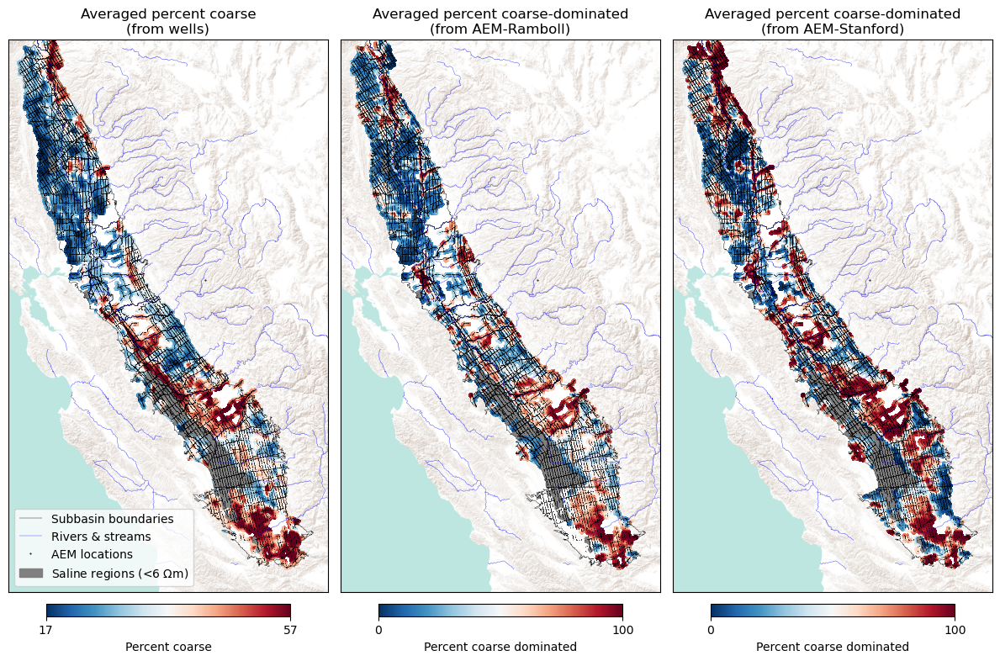

In [167]:
import matplotlib
matplotlib.rcParams['font.size'] = 10

fig, axs = plt.subplots(1,3, figsize=(12, 8))
ax1, ax2, ax3 = axs
xlim = (-235738.88808281758, 146356.82349804082)
ylim = (-372488.7201856468, 287608.05395729607)
show(src, ax=ax1, alpha=1)
show(src, ax=ax2, alpha=1)
show(src, ax=ax3, alpha=1)

out = mesh_orig.plot_image(fc_cvhm_avg_int, ax=ax1, pcolor_opts={'cmap':'RdBu_r'}, clim=(17, 57))
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax1)
cb.set_label("Percent coarse")
cb.set_ticks([17,57])
ax1.set_title("Averaged percent coarse\n(from wells)")



out = mesh_orig.plot_image(fc_avg_cdwr*100, ax=ax2, pcolor_opts={'cmap':'RdBu_r'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax2)
cb.set_label("Percent coarse dominated")
cb.set_ticks([0,100])
ax2.set_title("Averaged percent coarse-dominated\n(from AEM-Ramboll)")

out = mesh_orig.plot_image(fc_final*100, ax=ax3, pcolor_opts={'cmap':'RdBu_r'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax3)
cb.set_label("Percent coarse dominated")
cb.set_ticks([0,100])
ax3.set_title("Averaged percent coarse-dominated\n(from AEM-Stanford)")

# Create inset_axes object
# axins = inset_axes(ax2, width='50%', height='15%', loc='upper right')
# out = axins.hist(y_tmp, bins=np.linspace(0,1,40), alpha=0.5, edgecolor='k', label='CVHM', density=True)
# out = axins.hist(x_tmp, bins=np.linspace(0,1,40), alpha=0.5, edgecolor='k', label='AEM', density=True)
# axins.legend(fontsize=8)
# axins.set_xlabel("FC or FCD")
# axins.set_ylabel("PDF")


for ii, ax in enumerate(axs):
    
    gdf_subbasin.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
    gdf_rho_salinity.plot(ax=ax, legend=True, color='grey')
    gdf_rivers_3310.plot(color='blue', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
    ax.plot(0,0, 'k.', label="AEM locations", ms=1)
    ax.plot(xy_aem[::5,0], xy_aem[::5,1], 'k,', alpha=0.3)
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)    
    ax.set_xticks([])
    ax.set_yticks([])  
    ax.set_xlabel("")
    ax.set_ylabel("")    
    # ax.axis('off')
    ax.set_aspect(1)
    ax.set_facecolor('lightgrey')
ax1.fill(x, y, color='grey', label='Saline regions (<6 $\Omega$m)')    
ax1.legend(loc=3)
plt.tight_layout()
plt.show()
fig.savefig('2d_fcd_maps_cvhm_cdwr.png', dpi=300)


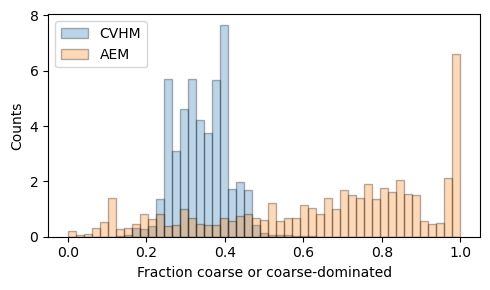

In [168]:
fig = plt.figure(figsize=(5,3))
out = plt.hist(y_tmp, bins=np.linspace(0,1), alpha=0.3, edgecolor='k', label='CVHM', density=True)
out = plt.hist(x_tmp, bins=np.linspace(0,1), alpha=0.3, edgecolor='k', label='AEM', density=True)


plt.legend()
plt.xlabel("Fraction coarse or coarse-dominated")
plt.ylabel("Counts")
plt.tight_layout()
fig.savefig("FC_aem_cvhm.png", dpi=200)

In [169]:
y_tmp.mean()

0.34043347426046666

In [170]:
x_tmp.mean()

0.658060422949149

In [171]:
z_tmp.mean()

0.48626065417601594

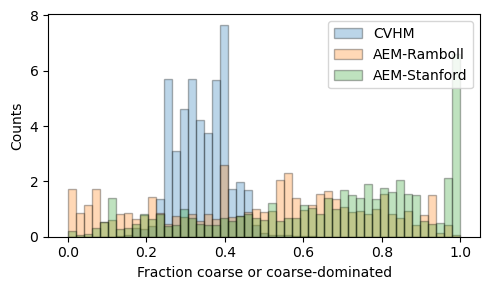

In [172]:
fig = plt.figure(figsize=(5,3))
out = plt.hist(y_tmp, bins=np.linspace(0,1), alpha=0.3, edgecolor='k', label='CVHM', density=True)
out = plt.hist(z_tmp, bins=np.linspace(0,1), alpha=0.3, edgecolor='k', label='AEM-Ramboll', density=True)
out = plt.hist(x_tmp, bins=np.linspace(0,1), alpha=0.3, edgecolor='k', label='AEM-Stanford', density=True)


plt.legend()
plt.xlabel("Fraction coarse or coarse-dominated")
plt.ylabel("Counts")
plt.tight_layout()
fig.savefig("FC_aem_cvhm_cdwr.png", dpi=200)

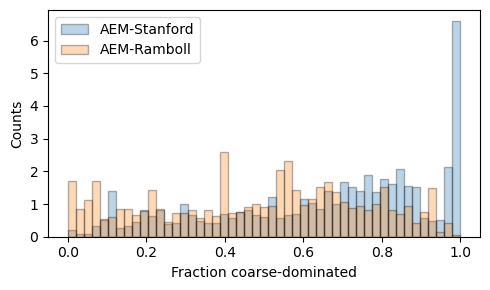

In [173]:
fig = plt.figure(figsize=(5,3))
out = plt.hist(x_tmp, bins=np.linspace(0,1), alpha=0.3, edgecolor='k', label='AEM-Stanford', density=True)
out = plt.hist(z_tmp, bins=np.linspace(0,1), alpha=0.3, edgecolor='k', label='AEM-Ramboll', density=True)



plt.legend()
plt.xlabel("Fraction coarse-dominated")
plt.ylabel("Counts")
plt.tight_layout()
fig.savefig("FC_aem_cvhm_cdwr.png", dpi=200)

In [174]:
file = '../data/SAGBI/sagbi_mod/sagbi_mod.shp'
gdf = gpd.read_file(file)

In [175]:
gdf.head(3)

,areasymbol,spatialver,musym,mukey,mukey_num,acres,mukey_1,cokey,deep_perc,rt_zn_res_,...,topo_rest,surf_cond,restrictns,sagbi,rat_grp,slope_l,slope_h,compname,taxsubgrp,geometry
0,ca674,4,Hn,457710,457710,3072.9,457710,11425818,87.3007,1.0000,...,100,100,No Restriction,27.1506,Poor,0,2,Hueneme,Aquic Xerofluvents,"MULTIPOLYGON (((78204.047 -427837.262, 78173.9..."
1,ca674,4,AcA,457659,457659,200.2,457659,11425434,87.3007,87.8630,...,100,100,No Restriction,92.9665,Excellent,0,2,Anacapa,Calcic Pachic Haploxerolls,"MULTIPOLYGON (((89074.390 -423425.575, 89110.0..."
2,ca672,4,LmG,457423,457423,34.5,457423,11362280,1.0000,62.5512,...,1,100,Lithic bedrock,9.8620,Very Poor,15,75,Lopez,Lithic Ultic Haploxerolls,"MULTIPOLYGON (((-26127.557 -371244.454, -26124..."


In [176]:
gdf_sagbi = gdf.clip(gdf_cv_3310)

In [177]:
gdf_sagbi.to_file("../data/SAGBI/sagbi_cv.shp")

In [178]:


# fig, axs = plt.subplots(1,2, figsize=(8, 8))
# ax1, ax2 = axs
# xlim = (-235738.88808281758, 146356.82349804082)
# ylim = (-372488.7201856468, 287608.05395729607)
# show(src, ax=ax1)
# show(src, ax=ax2)
# gdf_basins_3310_cv_active.plot(
#     column='rho_fine_50th', cmap='turbo', ax=ax1, legend=True, legend_kwds=legend_kwds,
#     norm=LogNorm(vmin=3, vmax=150),
# )

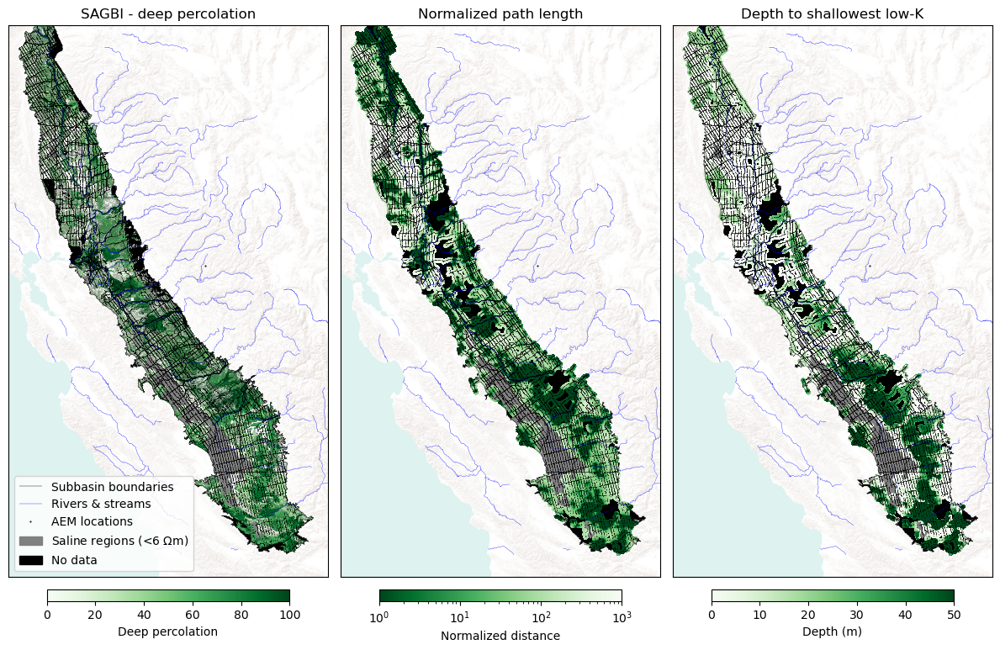

In [179]:
import matplotlib
matplotlib.rcParams['font.size'] = 10

fig, axs = plt.subplots(1,3, figsize=(12, 8))
ax1, ax2, ax3 = axs
xlim = (-235738.88808281758, 146356.82349804082)
ylim = (-372488.7201856468, 287608.05395729607)
show(src, ax=ax1, alpha=0.5)
show(src, ax=ax2, alpha=0.5)
show(src, ax=ax3, alpha=0.5)

# out = mesh_orig.plot_image(fc_final, ax=ax1, pcolor_opts={'cmap':'RdBu_r'})
legend_kwds = {'fraction':0.02, 'pad':0.02, 'orientation':'horizontal', 'label':'Deep percolation'}
gdf_cv_3310.plot(color='k', ax=ax1)
gdf_sagbi.plot(column="deep_perc", cmap='Greens', ax=ax1, legend=True, legend_kwds=legend_kwds,)
# cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax1)
# cb.set_label("Percent coarse dominated")
ax1.set_title("SAGBI - deep percolation")

gdf_cv_3310.plot(color='k', ax=ax2)
out = mesh_orig.plot_image(path_length_30_norm_final, ax=ax2,  pcolor_opts={'norm':LogNorm(vmin=1, vmax=1000), 'cmap':'Greens_r'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax2)
cb.set_label("Normalized distance")
ax2.set_title("Normalized path length")

gdf_cv_3310.plot(color='k', ax=ax3)
out = mesh_orig.plot_image(path_to_no_flow_30_final, ax=ax3, clim=(0, 50), pcolor_opts={'cmap':'Greens'})
cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax3)
cb.set_label("Depth (m)")
ax3.set_title("Depth to shallowest low-K")


for ax in axs:
    gdf_subbasin.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
    gdf_rho_salinity.plot(ax=ax, legend=True, color='grey')
    # gdf_cv_3310.boundary.plot(color='k', linewidth=0.3, ax=ax, label='CV boundary')    
    gdf_rivers_3310.plot(color='blue', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
    ax.plot(0,0, 'k.', label="AEM locations", ms=1)
    ax.plot(xy_aem[::5,0], xy_aem[::5,1], 'k,', alpha=0.3)
    ax.set_xticks([])
    ax.set_yticks([])  
    ax.set_xlabel("")
    ax.set_ylabel("")    
    # ax.axis('off')
    ax.set_xlim(xlim)
    ax.set_ylim(ylim)
    ax.set_aspect(1)
ax1.fill(x, y, color='grey', label='Saline regions (<6 $\Omega$m)')    
ax1.fill((0,0), (1,1), color='k', label='No data')
ax1.legend(loc=3)
plt.tight_layout()
plt.show()
fig.savefig('2d_path_maps.png', dpi=300)

In [180]:
res = stats.linregress(x_tmp, y_tmp)
fc_final_scaled=res.intercept + fc_final*res.slope


Text(0, 0.5, 'FC CVHM')

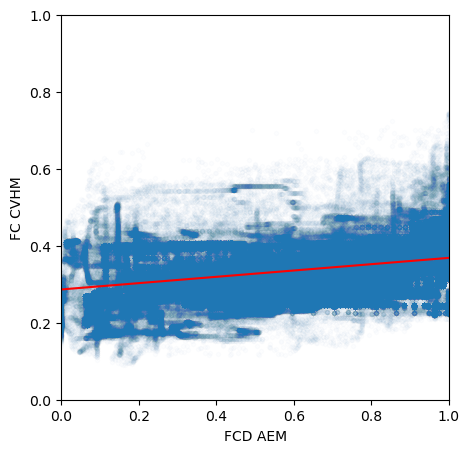

In [181]:
fig = plt.figure(figsize=(5,5))
plt.plot(x_tmp, y_tmp, '.', alpha=0.01)
plt.plot(np.array([0,1]), res.intercept + res.slope*np.array([0,1]), 'r', label='fitted line')
plt.xlim(0, 1)
plt.ylim(0, 1)
plt.xlabel("FCD AEM")
plt.ylabel("FC CVHM")


In [182]:
# import matplotlib
# matplotlib.rcParams['font.size'] = 10

# fig, axs = plt.subplots(1,2, figsize=(8, 8))
# ax1, ax2 = axs
# xlim = (-235738.88808281758, 146356.82349804082)
# ylim = (-372488.7201856468, 287608.05395729607)
# show(src, ax=ax1, alpha=0.5)
# show(src, ax=ax2, alpha=0.5)

# out = mesh_orig.plot_image(fc_cvhm_avg_int*0.01, ax=ax1, pcolor_opts={'cmap':'RdBu_r'}, clim=(0.1,0.75))
# cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax1)
# cb.set_label("Fraction coarse")
# ax1.set_title("Averaged fraction coarse (CVHM)")

# out = mesh_orig.plot_image(fc_final_scaled, ax=ax2, pcolor_opts={'cmap':'RdBu_r'})
# cb = plt.colorbar(out[0], orientation='horizontal', fraction=0.02, pad=0.02, ax=ax2)
# cb.set_label("Fraction coarse dominated")
# ax2.set_title("Averaged fraction coarse-dominated (AEM)")


# for ii, ax in enumerate(axs):
    
#     gdf_subbasin.boundary.plot(color='k', linewidth=0.3, ax=ax, label='Subbasin boundaries')
#     gdf_rho_salinity.plot(ax=ax, legend=True, color='grey')
#     gdf_rivers_3310.plot(color='blue', linewidth=0.3, ax=ax, alpha=0.8, label='Rivers & streams')
#     # ax.plot(xy_aem[::10,0], xy_aem[::10,1], 'k,', alpha=0.1)
#     ax.set_xlim(xlim)
#     ax.set_ylim(ylim)    
#     ax.set_xticks([])
#     ax.set_yticks([])  
#     ax.set_xlabel("")
#     ax.set_ylabel("")    
#     # ax.axis('off')
#     ax.set_aspect(1)
#     ax.set_facecolor('lightgrey')
# ax1.fill(x, y, color='grey', label='Saline regions (<6 $\Omega$m)')    
# ax1.legend(loc=3)
# plt.tight_layout()
# plt.show()
# fig.savefig('2d_fcd_maps_cvhm.png', dpi=300)

In [183]:
from emrecharge.gis import export_to_tif

In [184]:
nx = mesh_orig.vnC[0]
ny = mesh_orig.vnC[1]
dx = mesh_orig.h[0][0]
dy = mesh_orig.h[1][0]

xmin = mesh_orig.x0[0]
ymin = mesh_orig.x0[1]
crs = 3310


In [185]:
values = path_length_10_norm_final.data.copy()
values[path_length_10_norm_final.mask] = np.nan
filename = 'cv_path_length_aem'
export_to_tif(values.reshape((nx, ny), order='F').T, dx, dy, xmin, ymin, crs, f'{filename}.tif')

In [186]:
values = path_to_no_flow_10_final.data.copy()
values[path_to_no_flow_10_final.mask] = np.nan
filename = 'cv_path_to_no_flow_aem'
export_to_tif(values.reshape((nx, ny), order='F').T, dx, dy, xmin, ymin, crs, f'{filename}.tif')

In [187]:
values = fc_final.data.copy()
values[fc_final.mask] = np.nan
filename = 'cv_fcd_aem'
export_to_tif(values.reshape((nx, ny), order='F').T, dx, dy, xmin, ymin, crs, f'{filename}.tif')

In [188]:
values = fc_avg_cdwr.data.copy()
values[fc_avg_cdwr.mask] = np.nan
filename = 'cv_fcd_aem_cdwr'
export_to_tif(values.reshape((nx, ny), order='F').T, dx, dy, xmin, ymin, crs, f'{filename}.tif')

In [189]:
fc_avg_cdwr.shape

(1410149,)

In [190]:
base_int.shape

(618777,)

In [191]:
mesh_orig.n_cells

1410149

In [192]:
values = base_int_final.data.copy()
values[base_int_final.mask] = np.nan
filename = 'cv_base'
export_to_tif(values.reshape((nx, ny), order='F').T, dx, dy, xmin, ymin, crs, f'{filename}.tif')

In [193]:
values = fc_cvhm_avg_int.data.copy()
values[fc_avg_cdwr.mask] = np.nan
filename = 'cv_fcd_cvhm'
export_to_tif(values.reshape((nx, ny), order='F').T, dx, dy, xmin, ymin, crs, f'{filename}.tif')

In [194]:
values = np.log10(rho_avg_final.data.copy())
values[rho_avg_final.mask] = np.nan
filename = 'cv_rho'
export_to_tif(values.reshape((nx, ny), order='F').T, dx, dy, xmin, ymin, crs, f'{filename}.tif')

In [195]:
# import subprocess
# folder='./'
# fpath='./'
# fname = f'{filename}.tif'
# fpath = f'{folder}/{fname}'
# fname_cog = f'{filename}_cog.tif'
# fpath_cog = f'{folder}/{fname_cog}'
# cmd = "rio cogeo create {:s} {:s}".format(fpath, fpath_cog)
# subprocess.check_call(cmd, shell=True, stdin=subprocess.DEVNULL, stdout=subprocess.DEVNULL, stderr=subprocess.DEVNULL);


In [214]:
gdf_rock_physics = gpd.read_file("./subbasins_cv_rockphysics.geojson")

In [219]:
gdf_rock_physics[gdf_rock_physics['Basin_Su_1']== 'SAN JOAQUIN VALLEY - KINGS']

,Basin_Su_1,Basin_Name,Basin_Subb,area_square_km,counts,sed_density,aem_counts,sed_counts,wt_counts,aem_density,wt_density,num_coloc_max,opt_coloc_distance,rho_fine_50th,rho_coarse_50th,ncolocs,geometry
14,SAN JOAQUIN VALLEY - KINGS,SAN JOAQUIN VALLEY,5-022.08,3971.338212,4573,1.151501,23137,4573,149,5.825996,0.037519,1259.0,90.0,18.70092,37.395665,110,"POLYGON ((26247.097 -117001.046, 26206.900 -11..."


In [222]:
gdf_rock_physics[gdf_rock_physics['Basin_Su_1']== 'SACRAMENTO VALLEY - BUTTE']

,Basin_Su_1,Basin_Name,Basin_Subb,area_square_km,counts,sed_density,aem_counts,sed_counts,wt_counts,aem_density,wt_density,num_coloc_max,opt_coloc_distance,rho_fine_50th,rho_coarse_50th,ncolocs,geometry
0,SACRAMENTO VALLEY - BUTTE,SACRAMENTO VALLEY,5-021.70,1074.438018,457,0.425339,14950,457,66,13.914251,0.061427,247.0,550.0,19.14959,54.749355,237,"POLYGON ((-141696.413 168792.474, -141582.646 ..."
